<a href="https://colab.research.google.com/github/junjieteoh/Stock-Price-Prediction-ML/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Engineering

In [ ]:
# data set https://www.kaggle.com/borismarjanovic/price-volume-data-for-all-us-stocks-etfs
# Download this dataset and store it in your google drive in the root folder
# /content/drive/MyDrive/...
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install pmdarima

In [ ]:
import pandas as pd
import numpy as np
pd.set_option("display.precision", 2)
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import statsmodels.api as sm
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
import random
from statsmodels.tsa.arima_model import ARIMA
from sklearn.preprocessing import MinMaxScaler
from pmdarima.arima.utils import ndiffs
%matplotlib inline

plt.style.use('bmh')

In [ ]:
!pwd


/content


In [ ]:
#spy.us.txt data 
df = pd.read_csv('/content/drive/MyDrive/Data/ETFs/spy.us.txt') 

In [ ]:
df.head(30) # From observation on data, Weekend not opened

,Date,Open,High,Low,Close,Volume,OpenInt
0,2005-02-25,104.77,106.00,104.68,105.79,70221808,0
1,2005-02-28,105.55,105.68,104.56,105.08,79695344,0
2,2005-03-01,105.22,105.87,105.22,105.62,54607412,0
3,2005-03-02,105.21,106.22,105.10,105.57,73733090,0
4,2005-03-03,105.99,106.20,105.15,105.61,71286823,0
5,2005-03-04,106.31,107.01,106.10,106.93,64483624,0
6,2005-03-07,106.86,107.38,106.62,106.97,50288014,0
7,2005-03-08,106.87,107.15,106.36,106.55,51274973,0
8,2005-03-09,106.25,106.52,105.38,105.39,84491113,0
9,2005-03-10,105.40,105.85,104.89,105.62,74962248,0


## Data pre-processing

In [ ]:
# Do EDA 
# look at data dimensionality, feature names, and feature types.
print(df.shape)

(3201, 7)


In [ ]:
print(df.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt'], dtype='object')


In [ ]:
print(df.info())
# we can see that no missing values in data 
# change date to date-type in Dtype 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3201 entries, 0 to 3200
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     3201 non-null   object 
 1   Open     3201 non-null   float64
 2   High     3201 non-null   float64
 3   Low      3201 non-null   float64
 4   Close    3201 non-null   float64
 5   Volume   3201 non-null   int64  
 6   OpenInt  3201 non-null   int64  
dtypes: float64(4), int64(2), object(1)
memory usage: 175.2+ KB
None


1. do EDA to see general statistics for each variables 
- look at distribution of each variables 


In [ ]:
df['Date'] = pd.to_datetime(df['Date']) #Convert Date from object to datetime64
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3201 entries, 0 to 3200
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     3201 non-null   datetime64[ns]
 1   Open     3201 non-null   float64       
 2   High     3201 non-null   float64       
 3   Low      3201 non-null   float64       
 4   Close    3201 non-null   float64       
 5   Volume   3201 non-null   int64         
 6   OpenInt  3201 non-null   int64         
dtypes: datetime64[ns](1), float64(4), int64(2)
memory usage: 175.2 KB
None


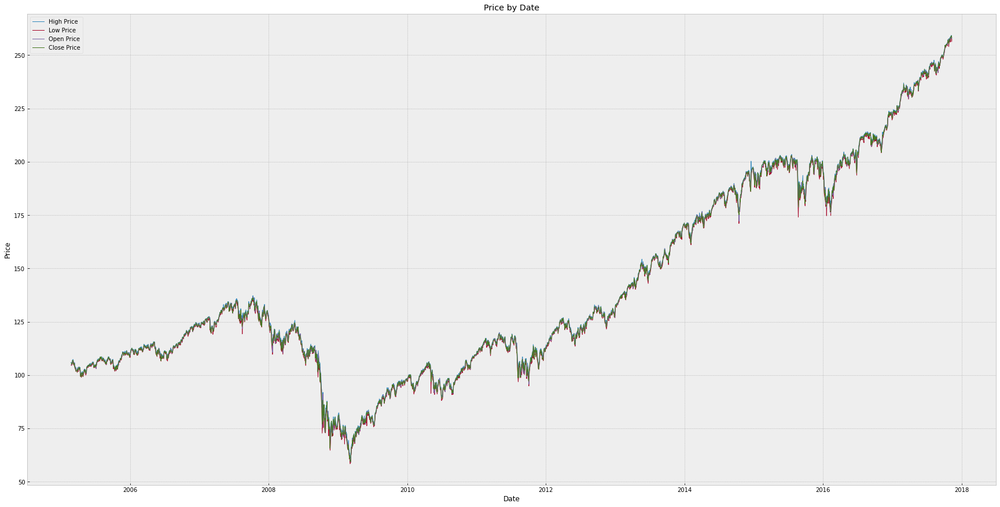

In [ ]:
plt.figure(figsize=(30, 15))

plt.plot(df.Date, df.High, label='High Price', linewidth=1)
plt.plot(df.Date, df.Low, label='Low Price', linewidth=1)
plt.plot(df.Date, df.Open, label='Open Price', linewidth=1)
plt.plot(df.Date, df.Close, label='Close Price', linewidth=1)

plt.title('Price by Date')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

plt.show()

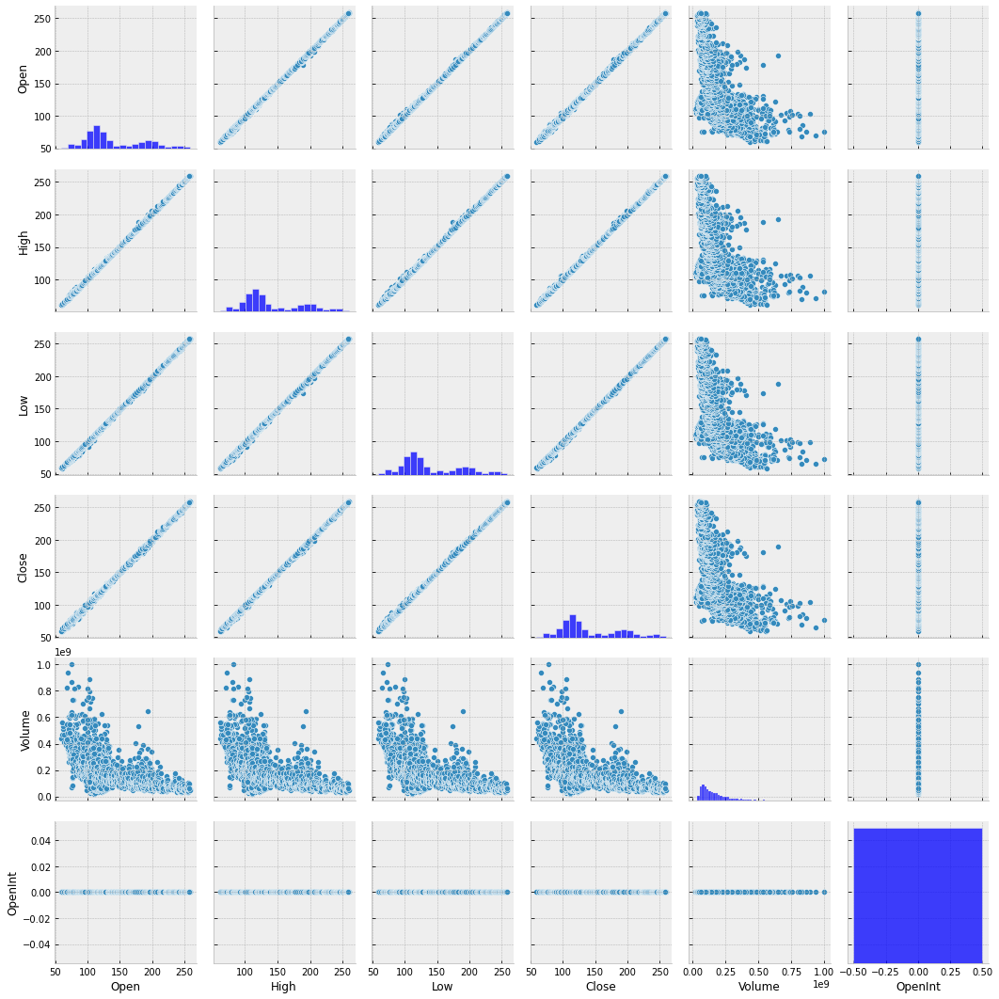

In [ ]:
sns.pairplot(df) # Strong correlation between open, close, high and low. We select close price as the predictor.

## different methods of feature engineering

### Method 1

In [ ]:
# suppose n = 10 : then output X1 to X10 is the time frame - of day1 to 10 
# row 1: X: Jan10 - Jan 20 |Y : price of Jan 21 
# row 2: X: Jan 11 - Jan 21 |Y : price of Jan 22
# row 3: X: Jan 12 - Jan 22 |Y : price of Jan 23
# ... 

def method1(df, n): # Use the closing price of n days to predict the closing price of n+1 day
  new_df = pd.DataFrame()
  close = df['Close'].values
  l = len(close)
  for i in range(n):
    column = close[i: l - n + i]
    name = 'X' + str(i+1)
    new_df[name] = column
  Y = close[n: l]
  new_df['Y'] = Y
  return new_df


In [ ]:
newdf1 = method1(df,10)
print(newdf1)


          X1      X2      X3      X4      X5      X6      X7      X8      X9  \
0     105.79  105.08  105.62  105.57  105.61  106.93  106.97  106.55  105.39   
1     105.08  105.62  105.57  105.61  106.93  106.97  106.55  105.39  105.62   
2     105.62  105.57  105.61  106.93  106.97  106.55  105.39  105.62  104.88   
3     105.57  105.61  106.93  106.97  106.55  105.39  105.62  104.88  105.54   
4     105.61  106.93  106.97  106.55  105.39  105.62  104.88  105.54  104.65   
...      ...     ...     ...     ...     ...     ...     ...     ...     ...   
3186  256.11  256.56  255.29  255.62  257.71  256.75  257.15  257.49  257.59   
3187  256.56  255.29  255.62  257.71  256.75  257.15  257.49  257.59  258.45   
3188  255.29  255.62  257.71  256.75  257.15  257.49  257.59  258.45  258.85   
3189  255.62  257.71  256.75  257.15  257.49  257.59  258.45  258.85  258.67   
3190  257.71  256.75  257.15  257.49  257.59  258.45  258.85  258.67  259.11   

         X10       Y  
0     105.62  10

### Method 2

In [ ]:
def method2(df, n): # Use the changes of closing price of n days to predict the closing price of n+1 day
  new_df = pd.DataFrame()
  close = df['Close'].values
  l = len(close)
  changes =  close[1:l] - close[0:l-1] 
  l = l - 1
  for i in range(n-1):
    column = changes[i: l - n + i]
    name = 'X' + str(i+1)
    new_df[name] = column
  Y = close[n: l]
  new_df['Y'] = Y
  return new_df

In [ ]:
newdf2 = method2(df,10)
print(newdf2)

        X1    X2    X3    X4    X5    X6    X7    X8    X9       Y
0    -0.71  0.54 -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23  104.88
1     0.54 -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  105.54
2    -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66  104.65
3     0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66 -0.89  103.77
4     1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66 -0.89 -0.88  103.99
...    ...   ...   ...   ...   ...   ...   ...   ...   ...     ...
3185 -1.00  0.45 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  258.45
3186  0.45 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  258.85
3187 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  0.40  258.67
3188  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  0.40 -0.18  259.11
3189  2.09 -0.96  0.40  0.34  0.10  0.86  0.40 -0.18  0.44  258.17

[3190 rows x 10 columns]


### Method 2B


In [ ]:
# Method 2B, change y to change in the n+1 day
def method2B(df, n): # Use the changes of closing price of n days to predict the closing price of n+1 day
  new_df = pd.DataFrame()
  close = df['Close'].values
  l = len(close)
  changes =  close[1:l] - close[0:l-1] 
  l = l - 1
  for i in range(n-1):
    column = changes[i: l - n + i]
    name = 'X' + str(i+1)
    new_df[name] = column
  Y = changes[n-1: l-1]
  new_df['Y'] = Y
  return new_df

### Method 3

In [ ]:
def method3(df, n): # Use the mean,variance, min, max, trend of n days to predict the closing price of n+1 day
  temp = method1(df,n)
  Y = temp['Y']
  new_df = pd.DataFrame()
  temp = temp.drop('Y', axis = 1)
  new_df['Mean'] = temp.mean(axis = 1)
  new_df['Variance'] = temp.var(axis = 1)
  new_df['Min'] = temp.min(axis = 1)
  new_df['Max'] = temp.max(axis = 1)
  new_df['Trend'] = temp.iloc[:,n-1] - temp.iloc[:,0]
  new_df['Y'] = Y
  return new_df



In [ ]:
newdf3 = method3(df,10)
print(newdf3)

        Mean  Variance     Min     Max  Trend       Y
0     105.91      0.44  105.08  106.97  -0.17  104.88
1     105.82      0.54  104.88  106.97  -0.20  105.54
2     105.87      0.49  104.88  106.97  -0.08  104.65
3     105.77      0.64  104.65  106.97  -0.92  103.77
4     105.59      1.04  103.77  106.97  -1.84  103.99
...      ...       ...     ...     ...    ...     ...
3186  256.87      0.99  255.29  258.45   2.34  258.85
3187  257.15      1.28  255.29  258.85   2.29  258.67
3188  257.36      1.45  255.29  258.85   3.38  259.11
3189  257.74      1.15  255.62  259.11   3.49  258.17
3190  257.99      0.60  256.75  259.11   0.46  258.09

[3191 rows x 6 columns]


### Research outcome

The following two sets of features were retrieved from different research paper. They might have a significant impact on the stock price.

**Feature set 1**

The following features are retrieved from *A hybrid SOFM-SVR with a filter-based feature selection for stock market forecasting* (https://www.sciencedirect.com/science/article/pii/S0957417407006069). 

1.   MA10: 10-day moving average
2.   RSI5: 5-day relative strength index
3.   K9: 9-day stochastic index K
4.   D9: 9-day stochastic index D
5.   MACD9: 9-day moving average convergence / divergence
6.   WR10: 10-day Larry Williams' oscillator
7.   PSY10: 10-day psychological line
8.   +DI10: directional indicator up
9.   -DI10: directional indicator down
10.  BIAS5: 5-day BIAS
11.  VR10: 10-day volume ratio
12.  AR20: 20-day A ratio
13.  BR20: 20-day B ratio

The formulea of the features can also be found in the source. Note that the number of days should be fixed (e.g. 10) in our project.

Features 1 - 4, 6 - 7, 10 - 13 are easily computable given the data we have.

**Feature set 2**

The following features are retrieved from *Stock Closing Price Prediction using Machine Learning Techniques* (https://www.sciencedirect.com/science/article/pii/S1877050920307924). 

1.   Stock High minus Low price (H-L)
2.   Stock Close minus Open price (O-C)
3.   Stock price’s seven days’ moving average (7 DAYS MA)
4.   Stock price’s fourteen days’ moving average (14 DAYS MA)
5.   Stock price’s twenty one days’ moving average (21 DAYS MA)
6.   Stock price’s standard deviation for the past seven days (7 DAYS STD DEV)

All features are easily computable given the data we have.





### Method 4
Method 4 uses feature set 2

In [ ]:
import math

# H-L on day t-1, O-C on day t-1
def splitDF(df, startIndex):
  new_df = pd.DataFrame()
  startIndex = startIndex + df.index[0]
  size = df.index[-1]
  HL = []
  OC = []
  for i in range(startIndex - 1, size - 1):
    HL.append(df.High[i] - df.Low[i])
    OC.append(df.Open[i] - df.Close[i])
  new_df['HL'] = HL
  new_df['OC'] = OC
  return new_df

# Use the H-L of day n (X1), the O-C of day n (X2), MA of n days (X3), 
# 2n/3 days (X4), n/3 days (X5), std dev of n/3 days (X6)
# to predict the close price on the n+1 day (Y).
def method4(df, n):
  splitted = splitDF(df, n)
  new_df = pd.DataFrame()
  # compute Y
  temp = method1(df,n)
  Y = temp['Y']
  temp = temp.drop('Y', axis = 1)
  new_df['X1'] = splitted['HL'] # H-L
  new_df['X2'] = splitted['OC'] # O-C
  new_df['X3'] = temp.mean(axis = 1) # moving average of n days
  for i in range(0, math.floor(n/3)):
    temp = temp.drop(columns=temp.columns[0], axis = 1)
  new_df['X4'] = temp.mean(axis = 1) # moving average of 2n/3 days
  for i in range(0, math.floor(n/3)):
    temp = temp.drop(columns=temp.columns[0], axis = 1)
  new_df['X5'] = temp.mean(axis = 1) # moving average of n/3 days
  new_df['X6'] = temp.var(axis = 1)**(1/2) # standard deviation of n/3 days
  new_df['Y'] = Y # close price on day n+1
  return new_df

In [ ]:
newdf4 = method4(df,21)
print(newdf4)

        X1    X2      X3      X4      X5    X6       Y
0     0.56  0.10  104.58  103.90  102.59  0.81  101.51
1     1.44  0.54  104.37  103.54  102.24  0.62  102.96
2     1.26 -1.11  104.27  103.36  102.20  0.54  102.77
3     0.51  0.20  104.14  103.16  102.18  0.52  102.30
4     1.81  1.04  103.98  102.98  102.24  0.50  102.48
...    ...   ...     ...     ...     ...   ...     ...
3174  1.56 -0.18  255.80  256.40  256.80  0.98  258.45
3175  1.20 -0.68  255.98  256.63  257.25  0.89  258.85
3176  0.78 -0.55  256.20  256.87  257.71  0.72  258.67
3177  1.24  0.30  256.42  257.08  257.85  0.81  259.11
3178  1.07 -0.64  256.64  257.32  258.19  0.77  258.17

[3179 rows x 7 columns]


## Train test split

In [ ]:
# train test split
random.seed(1)
startDay = '2009-01-01'
midDay = '2015-12-31'
train = df[(df.Date >= startDay) & (df.Date <= midDay)]
test = df[df.Date > midDay]

In [ ]:
#apply the methods to the train set and test set respectively
# set n = 100 days first
N = 100
train_1 = method1(train, N)
test_1 = method1(test, N)
train_2 = method2(train, N)
test_2 = method2(test, N)
train_3 = method3(train, N)
test_3 = method3(test, N)
train_4_21 = method4(train, 21)
test_4_21 = method4(test, 21)
train_4 = method4(train, N)
test_4 = method4(test, N)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


In [ ]:
def getX(data):
  n = data.shape[1]
  return data.iloc[:, 0:n - 1]

In [ ]:
def getY(data):
  n = data.shape[1]
  return data.iloc[:,n - 1]


In [ ]:
train_x_1 = getX(train_1)
train_y_1 = getY(train_1)
test_x_1 = getX(test_1)
test_y_1 = getY(test_1)
train_x_2 = getX(train_2)
train_y_2 = getY(train_2)
test_x_2 = getX(test_2)
test_y_2 = getY(test_2)
train_x_3 = getX(train_3)
train_y_3 = getY(train_3)
test_x_3 = getX(test_3)
test_y_3 = getY(test_3)
train_x_4_21 = getX(train_4_21)
train_y_4_21 = getY(train_4_21)
test_x_4_21 = getX(test_4_21)
test_y_4_21 = getY(test_4_21)
train_x_4 = getX(train_4)
train_y_4 = getY(train_4)
test_x_4 = getX(test_4)
test_y_4 = getY(test_4)


# Model 1: Linear regression
We will use three linear regression models: 
1.   cv selected linear regression model with optimal n
2.   ridge regression with 10-fold cross validation
3.   linear regression with SGD
The error metric used is mean square error. 

In [ ]:
from sklearn.linear_model import Ridge,RidgeCV, SGDRegressor, LinearRegression
from sklearn.linear_model import Lasso, LassoCV
from sklearn.metrics import mean_squared_error

In [ ]:
def TimeSeriesCV(x, y, n_splits):
  len = x.shape[0]
  groupSize = len // n_splits
  remain = len % n_splits
  frontIndex =  [0 for i in range(10)] 
  backIndex = [0 for i in range(10)] 
  front = 0
  back = front + groupSize

  cv_error = 0

  for i in range(n_splits):
    frontIndex[i] = front
    if remain > 0:
      remain = remain - 1
      back = back + 1
    backIndex[i] = back
    front = back
    back = front + groupSize
 
  for j in range(n_splits-1):
    f = frontIndex[j]
    b = backIndex[j]
    f_next = frontIndex[j+1]
    b_next = backIndex[j+1]

    temp_x = x.iloc[f:b]
    temp_y = y.iloc[f:b]

    temp_validate_x = x.iloc[f_next:b_next]
    temp_validate_y = y.iloc[f_next:b_next]

    model = LinearRegression()
    temp_pred_y = model.fit(temp_x, temp_y).predict(temp_validate_x)
    temp_mse = np.mean((temp_pred_y - temp_validate_y)**2)
    cv_error = cv_error + temp_mse
  return cv_error/n_splits


**Method** 1:

In [ ]:
# Verify which n is better 
total_n = 100
cv_error = []
for i in range(1, total_n + 1):
  train_1_i = method1(train, i)
  train_x_1_i = getX(train_1_i)
  train_y_1_i = getY(train_1_i)
  
  scores = TimeSeriesCV(train_x_1_i,train_y_1_i , 10)
  cv_error.append(np.mean(np.absolute(scores)))


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


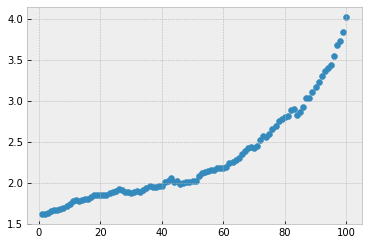

In [ ]:
numberOfDays = range(1, total_n + 1)
plt.scatter(numberOfDays, cv_error)
# CV suggest using more days in prediction cause higher error. Use past three days to predict next day will be a good choice.

In [ ]:
# train test split using method 1 and n = 1
train_1_1 = method1(train, 1)
train_x_1_1 = getX(train_1_1)
train_y_1_1 = getY(train_1_1)
test_1_1 = method1(test, 1)
test_x_1_1 = getX(test_1_1)
test_y_1_1 = getY(test_1_1)
lm_fit_1_1 = sm.OLS(train_y_1_1, train_x_1_1).fit()
print(lm_fit_1_1.summary())

# Calculate test error using method 1 and n = 1
model_fit_1_1 = LinearRegression().fit(train_x_1_1, train_y_1_1)
y_pred_1_1 = model_fit_1_1.predict(test_x_1_1)
test_error = np.mean((y_pred_1_1 - test_y_1_1) ** 2)
train_error = cv_error[0]
print("Method 1 error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)


                                 OLS Regression Results                                
Dep. Variable:                      Y   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.977e+07
Date:                Sun, 27 Nov 2022   Prob (F-statistic):                        0.00
Time:                        05:26:43   Log-Likelihood:                         -2997.8
No. Observations:                1760   AIC:                                      5998.
Df Residuals:                    1759   BIC:                                      6003.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

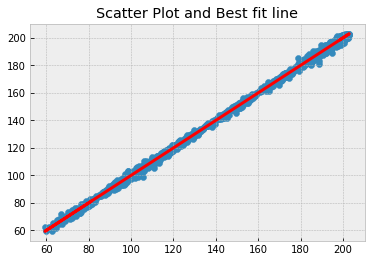

In [ ]:
plt.scatter(train_x_1_1, train_y_1_1)
plt.plot(train_x_1_1, model_fit_1_1.predict(train_x_1_1), color="red", linewidth=3)
plt.title("Scatter Plot and Best fit line")
plt.show()

Method 2:

In [ ]:
# Verify which n is better
# lowest n is 2 as we are comparing changes between two days
total_n = 100
cv_error = []
for i in range(2, total_n + 1):
  train_2_i = method2(train, i)
  train_x_2_i = getX(train_2_i)
  train_y_2_i = getY(train_2_i)
  
  scores = TimeSeriesCV(train_x_2_i,train_y_2_i , 10)

  cv_error.append(np.mean(np.absolute(scores)))

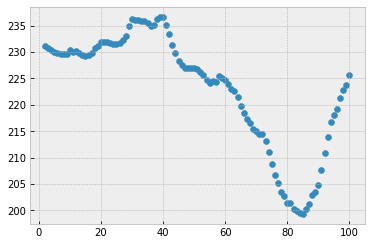

In [ ]:
numberOfDays = range(2, total_n + 1)
plt.scatter(numberOfDays, cv_error)
# 3 is the optimal

In [ ]:
# train test split using method 2 and n = 3
train_2_3 = method2(train, 3)
train_x_2_3 = getX(train_2_3)
train_y_2_3 = getY(train_2_3)
test_2_3 = method2(test, 3)
test_x_2_3 = getX(test_2_3)
test_y_2_3 = getY(test_2_3)

In [ ]:
model_fit_2_3 = LinearRegression().fit(train_x_2_3, train_y_2_3)
y_pred_2_3 = model_fit_2_3.predict(test_x_2_3)
test_error = np.mean((y_pred_2_3 - test_y_2_3) ** 2)
train_error = np.mean((train_y_2_3 -  model_fit_2_3.predict(train_x_2_3)) ** 2)
print("Method 2 error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)
# Extremely large error

Method 2 error:
Train Error:  1590.47932043057
Test Error:  7741.652485715747


In [ ]:
# possible reasons:
# 1. this method is using the changes in n days to predict the price of n+1 day, they are in different scales.
# 2. stock price always go up then go down, hard to use daily changes to make prediction

In [ ]:
# Method 2B, change y to change in the n+1 day
def method2B(df, n): # Use the changes of closing price of n days to predict the closing price of n+1 day
  new_df = pd.DataFrame()
  close = df['Close'].values
  l = len(close)
  changes =  close[1:l] - close[0:l-1] 
  l = l - 1
  for i in range(n-1):
    column = changes[i: l - n + i]
    name = 'X' + str(i+1)
    new_df[name] = column
  Y = changes[n-1: l-1]
  new_df['Y'] = Y
  return new_df

In [ ]:
newdf2B = method2B(df,10)
print(newdf2B)

        X1    X2    X3    X4    X5    X6    X7    X8    X9     Y
0    -0.71  0.54 -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74
1     0.54 -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66
2    -0.05  0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66 -0.89
3     0.04  1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66 -0.89 -0.88
4     1.32  0.04 -0.42 -1.16  0.23 -0.74  0.66 -0.89 -0.88  0.22
...    ...   ...   ...   ...   ...   ...   ...   ...   ...   ...
3185 -1.00  0.45 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  0.86
3186  0.45 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  0.40
3187 -1.27  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  0.40 -0.18
3188  0.33  2.09 -0.96  0.40  0.34  0.10  0.86  0.40 -0.18  0.44
3189  2.09 -0.96  0.40  0.34  0.10  0.86  0.40 -0.18  0.44 -0.94

[3190 rows x 10 columns]


In [ ]:
# Repeat the process again
# Verify which n is better
# lowest n is 2 as we are comparing changes between two days
total_n =100
cv_error = []
for i in range(2, total_n + 1):
  train_2B_i = method2B(train, i)
  train_x_2B_i = getX(train_2B_i)
  train_y_2B_i = getY(train_2B_i)
  
  scores = TimeSeriesCV(train_x_2B_i,train_y_2B_i , 10)

  cv_error.append(np.mean(np.absolute(scores)))

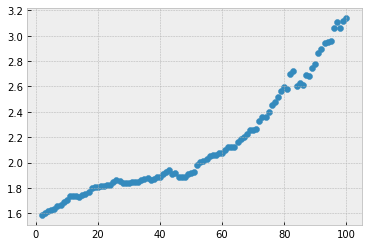

In [ ]:
numberOfDays = range(2, total_n + 1)
plt.scatter(numberOfDays, cv_error)
# n = 2

In [ ]:
train_2B_2 = method2B(train, 2)
train_x_2B_2 = getX(train_2B_2)
train_y_2B_2 = getY(train_2B_2)
test_2B_2 = method2B(test, 2)
test_x_2B_2 = getX(test_2B_2)
test_y_2B_2 = getY(test_2B_2)

In [ ]:
model_fit_2B_2 = LinearRegression().fit(train_x_2B_2, train_y_2B_2)
y_pred_2B_2 = model_fit_2B_2.predict(test_x_2B_2)
train_error = cv_error[0]
test_error = np.mean((y_pred_2B_2 - test_y_2B_2) ** 2)
eps_2B = (y_pred_2B_2 - test_y_2B_2)
print("Method 2B error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)
# Similar result as method 1

Method 2B error:
Train Error:  1.5825218218918866
Test Error:  1.8728750868277915


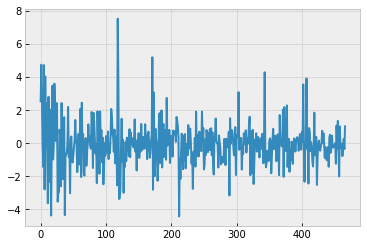

In [ ]:
plt.plot(eps_2B)

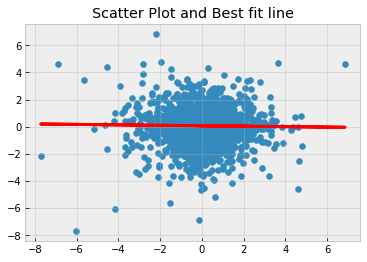

In [ ]:
plt.scatter(train_x_2B_2, train_y_2B_2)
plt.plot(train_x_2B_2, model_fit_2B_2.predict(train_x_2B_2), color="red", linewidth=3)
plt.title("Scatter Plot and Best fit line")
plt.show()

In [ ]:
lm_fit_2_2 = sm.OLS(train_y_2B_2, train_x_2B_2).fit()
print(lm_fit_2_2.summary())

                                 OLS Regression Results                                
Dep. Variable:                      Y   R-squared (uncentered):                   0.000
Model:                            OLS   Adj. R-squared (uncentered):             -0.000
Method:                 Least Squares   F-statistic:                             0.3406
Date:                Sun, 27 Nov 2022   Prob (F-statistic):                       0.560
Time:                        05:27:18   Log-Likelihood:                         -2995.8
No. Observations:                1758   AIC:                                      5994.
Df Residuals:                    1757   BIC:                                      5999.
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

Method 3

In [ ]:
# Repeat the process again
# Verify which n is better
# lowest n is 2 as we are comparing changes between two days
total_n = 100
cv_error = []
for i in range(2, total_n + 1):
  train_3_i = method3(train, i)
  train_x_3_i = getX(train_3_i)
  train_y_3_i = getY(train_3_i)
  
  scores = TimeSeriesCV(train_x_3_i,train_y_3_i , 10)

  cv_error.append(np.mean(np.absolute(scores)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


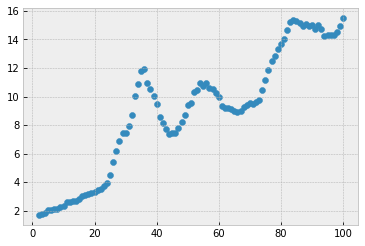

In [ ]:
numberOfDays = range(2, total_n + 1)
plt.scatter(numberOfDays, cv_error)
# cv error increase if more days are used in prediction. n = 3 is selected

In [ ]:
# train test split using method 2 and n = 3
train_3_3 = method3(train, 3)
train_x_3_3 = getX(train_3_3)
train_y_3_3 = getY(train_3_3)
test_3_3 = method3(test, 3)
test_x_3_3 = getX(test_3_3)
test_y_3_3 = getY(test_3_3)

In [ ]:
model_fit_3_3 = LinearRegression().fit(train_x_3_3, train_y_3_3)
y_pred_3_3 = model_fit_3_3.predict(test_x_3_3)
train_error = cv_error[0]
test_error = np.mean((y_pred_3_3 - test_y_3_3) ** 2)
eps_3 = (y_pred_3_3 - test_y_3_3)
print("Method 3 error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)
# Similar error as method 1 and 2

Method 3 error:
Train Error:  1.6696032403838146
Test Error:  1.9097085478238336


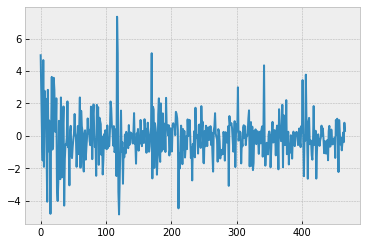

In [ ]:
plt.plot(eps_3)

Method 4

In [ ]:
# Repeat the process again
# Verify which n is better
# lowest n is 2 as we are comparing changes between two days
total_n = 100
cv_error = []
for i in range(6, total_n + 1):
  train_4_i = method4(train, i)
  train_x_4_i = getX(train_4_i)
  train_y_4_i = getY(train_4_i)
  
  scores = TimeSeriesCV(train_x_4_i,train_y_4_i , 10)

  cv_error.append(np.mean(np.absolute(scores)))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


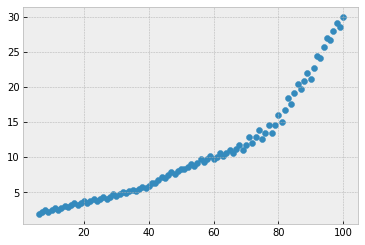

In [ ]:
numberOfDays = range(6, total_n + 1)
plt.scatter(numberOfDays, cv_error)
# cv error increase if more days are used in prediction. n = 3 is selected

In [ ]:
print(cv_error)

[1.8329188458791066, 2.157812930140812, 2.4183866476141676, 2.1998721936540098, 2.4603529526529093, 2.815570100267883, 2.4895247529855773, 2.795386636777498, 3.0826563264018896, 2.8313433807435504, 3.1136665812152264, 3.4185855812619357, 3.1535498196567042, 3.4365432381138477, 3.7585268699712264, 3.3989941096344145, 3.752278152537502, 4.073845672438372, 3.7535634028296436, 4.07344279598784, 4.371495576323396, 4.079951470570898, 4.371141097404635, 4.682720053281776, 4.389046283056347, 4.699698007788859, 5.050616337981403, 4.832133748549994, 5.142734568302762, 5.3573587692197036, 5.1588862144543715, 5.421012555071508, 5.7837711831284, 5.535139614596252, 5.888809326214064, 6.319743796053291, 6.242867237332699, 6.746514487657365, 7.1338611184748215, 7.045352973207431, 7.403466516010217, 7.841707576028364, 7.616016977527742, 7.981565494173997, 8.369492437643025, 8.267352395606169, 8.616608192694388, 9.057865567179126, 8.702684811616608, 9.126961814579172, 9.690041183988384, 9.24411411163235

In [ ]:
# train test split using method 4 and n = 6
train_4_6 = method4(train, 6)
train_x_4_6 = getX(train_4_6)
train_y_4_6 = getY(train_4_6)
test_4_6 = method4(test, 6)
test_x_4_6 = getX(test_4_6)
test_y_4_6 = getY(test_4_6)

In [ ]:
model_fit_4_6 = LinearRegression().fit(train_x_4_6, train_y_4_6)
y_pred_4_6 = model_fit_4_6.predict(test_x_4_6)
train_error = cv_error[0]
test_error = np.mean((y_pred_4_6 - test_y_4_6) ** 2)
print("Method 4 error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)
# Similar error as method 1 and 2

Method 4 error:
Train Error:  1.8329188458791066
Test Error:  1.9279250517897064


In [ ]:
# train test split using method 4 and n = 21
train_4_21 = method4(train, 21)
train_x_4_21 = getX(train_4_21)
train_y_4_21 = getY(train_4_21)
test_4_21 = method4(test, 21)
test_x_4_21 = getX(test_4_21)
test_y_4_21 = getY(test_4_21)

In [ ]:
model_fit_4_21 = LinearRegression().fit(train_x_4_21, train_y_4_21)
y_pred_4_21 = model_fit_4_21.predict(test_x_4_21)
train_error = np.mean((train_y_4_21 -  model_fit_4_21.predict(train_x_4_21)) ** 2)
test_error = np.mean((y_pred_4_21 - test_y_4_21) ** 2)
print("Method 4 error:")
print("Train Error: ", train_error)
print("Test Error: ", test_error)
# Similar error as method 1 and 2

Method 4 error:
Train Error:  3.2622858796330654
Test Error:  2.692633970240567


Using regression model, it suggest using first three days data to predict the price of next day has the minimum lost. However clearly it does not make use of the history data and not accurate. We should try to use more predictors but with restriction. Which are ridge regression and lasso regerssion.

###Ridge

In [ ]:
def TimeSeriesRidgeCV(x, y, n_splits):
  len = x.shape[0]
  groupSize = len // n_splits
  remain = len % n_splits
  frontIndex =  [0 for i in range(10)] 
  backIndex = [0 for i in range(10)] 
  front = 0
  back = front + groupSize


  for i in range(n_splits):
    frontIndex[i] = front
    if remain > 0:
      remain = remain - 1
      back = back + 1
    backIndex[i] = back
    front = back
    back = front + groupSize
 
  min_cv_err = 10000000
  min_a = 0

  for a in range(0,100):
    cv_error = 0
    for j in range(n_splits-1):
      f = frontIndex[j]
      b = backIndex[j]
      f_next = frontIndex[j+1]
      b_next = backIndex[j+1]

      temp_x = x.iloc[f:b]
      temp_y = y.iloc[f:b]

      temp_validate_x = x.iloc[f_next:b_next]
      temp_validate_y = y.iloc[f_next:b_next]

      model = Ridge(alpha = a)
      temp_pred_y = model.fit(temp_x, temp_y).predict(temp_validate_x)
      temp_mse = np.mean((temp_pred_y - temp_validate_y)**2)
      cv_error = cv_error + temp_mse
    cv_error = cv_error/n_splits
    if cv_error < min_cv_err:
      min_cv_err = cv_error
      min_a = a
  return Ridge(alpha = min_a).fit(x,y)

  



In [ ]:
ridge1 = TimeSeriesRidgeCV(train_x_1,train_y_1,10)
ridge1_train_error = mean_squared_error(train_y_1, ridge1.predict(train_x_1))
ridge1error = mean_squared_error(test_y_1, ridge1.predict(test_x_1))
print("Method 1 test error:")
print("ridge regression with 10-fold cross validation training error: ", ridge1_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge1error)

Method 1 test error:
ridge regression with 10-fold cross validation training error:  1.581312116512089
ridge regression with 10-fold cross validation testing error:  1.476840194384113


In [ ]:
ridge2 = TimeSeriesRidgeCV(train_x_2,train_y_2,10)
ridge2_train_error = mean_squared_error(train_y_2, ridge2.predict(train_x_2))
ridge2error = mean_squared_error(test_y_2, ridge2.predict(test_x_2))
print("Method 2 error:")
print("ridge regression with 10-fold cross validation training error: ", ridge2_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge2error)


Method 2 error:
ridge regression with 10-fold cross validation training error:  1423.6324102534873
ridge regression with 10-fold cross validation testing error:  7851.578360561304


In [ ]:
train_2B = method2B(train,N)
test_2B = method2B(test, N)

train_x_2B = getX(train_2B)
train_y_2B = getY(train_2B)
test_x_2B = getX(test_2B)
test_y_2B = getY(test_2B)

ridge2 = TimeSeriesRidgeCV(train_x_2B,train_y_2B,10)
ridge2B_train_error = mean_squared_error(train_y_2B, ridge2.predict(train_x_2B))
ridge2error = mean_squared_error(test_y_2B, ridge2.predict(test_x_2B))
print("Method 2B error:")
print("ridge regression with 10-fold cross validation training error: ", ridge2B_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge2error)

Method 2B error:
ridge regression with 10-fold cross validation training error:  1.5814069055758733
ridge regression with 10-fold cross validation testing error:  1.4647359010949457


In [ ]:
ridge3 = TimeSeriesRidgeCV(train_x_3,train_y_3,10)
ridge3_train_error = mean_squared_error(train_y_3, ridge3.predict(train_x_3))
ridge3error = mean_squared_error(test_y_3, ridge3.predict(test_x_3))

print("Method 3 error:")
print("ridge regression with 10-fold cross validation training error: ", ridge3_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge3error)


Method 3 error:
ridge regression with 10-fold cross validation training error:  6.982011564140447
ridge regression with 10-fold cross validation testing error:  5.604310355182646


In [ ]:
ridge4 = TimeSeriesRidgeCV(train_x_4,train_y_4,10)
ridge4_train_error = mean_squared_error(train_y_4, ridge4.predict(train_x_4))
ridge4error = mean_squared_error(test_y_4, ridge4.predict(test_x_4))

print("Method 4 error:")
print("ridge regression with 10-fold cross validation training error: ", ridge4_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge4error)


Method 4 error:
ridge regression with 10-fold cross validation training error:  8.825595502301635
ridge regression with 10-fold cross validation testing error:  6.5562604813175485


In [ ]:
ridge4_21 =  TimeSeriesRidgeCV(train_x_4_21,train_y_4_21,10)
ridge4_21.fit(train_x_4_21,train_y_4_21)
ridge4_21_train_error = mean_squared_error(train_y_4_21, ridge4_21.predict(train_x_4_21))
ridge4_21_error = mean_squared_error(test_y_4_21, ridge4_21.predict(test_x_4_21))

print("Method 4 n = 21 error:")
print("ridge regression with 10-fold cross validation training error: ", ridge4_21_train_error)
print("ridge regression with 10-fold cross validation testing error: ", ridge4_21_error)


Method 4 n = 21 error:
ridge regression with 10-fold cross validation training error:  3.2622949081889656
ridge regression with 10-fold cross validation testing error:  2.6929945982348635


###Lasso

In [ ]:
def TimeSeriesLassoCV(x, y, n_splits):
  len = x.shape[0]
  groupSize = len // n_splits
  remain = len % n_splits
  frontIndex =  [0 for i in range(10)] 
  backIndex = [0 for i in range(10)] 
  front = 0
  back = front + groupSize


  for i in range(n_splits):
    frontIndex[i] = front
    if remain > 0:
      remain = remain - 1
      back = back + 1
    backIndex[i] = back
    front = back
    back = front + groupSize
 
  min_cv_err = 10000000
  min_a = 0

  for a in range(1,100):
    cv_error = 0
    for j in range(n_splits-1):
      f = frontIndex[j]
      b = backIndex[j]
      f_next = frontIndex[j+1]
      b_next = backIndex[j+1]

      temp_x = x.iloc[f:b]
      temp_y = y.iloc[f:b]

      temp_validate_x = x.iloc[f_next:b_next]
      temp_validate_y = y.iloc[f_next:b_next]

      model = Lasso(alpha = a)
      temp_pred_y = model.fit(temp_x, temp_y).predict(temp_validate_x)
      temp_mse = np.mean((temp_pred_y - temp_validate_y)**2)
      cv_error = cv_error + temp_mse
    cv_error = cv_error/n_splits
    if cv_error < min_cv_err:
      min_cv_err = cv_error
      min_a = a
  return Lasso(alpha = min_a).fit(x,y)

  



In [ ]:
lasso1 = TimeSeriesLassoCV(train_x_1, train_y_1, 10)
lasso1_train_error = mean_squared_error(train_y_1, lasso1.predict(train_x_1))
lasso1error = mean_squared_error(test_y_1, lasso1.predict(test_x_1))
print("Method 1 error:")
print("lasso regression with 10-fold cross validation training error: ", lasso1_train_error)
print("lasso regression with 10-fold cross validation testing error: ", lasso1error)

Method 1 error:
lasso regression with 10-fold cross validation training error:  1.870938677488339
lasso regression with 10-fold cross validation testing error:  1.533785766322723


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.122e+02, tolerance: 2.395e+02
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
lasso2B = TimeSeriesLassoCV(train_x_2B, train_y_2B, 10)
lasso2B_train_error = mean_squared_error(train_y_2B, lasso2B.predict(train_x_2B))
lasso2Berror = mean_squared_error(test_y_2B, lasso2B.predict(test_x_2B))
print("Method 2B error:")
print("lasso regression with 10-fold cross validation training error: ", lasso2B_train_error)
print("lasso regression with 10-fold cross validation testing error: ", lasso2Berror)

Method 2B error:
lasso regression with 10-fold cross validation training error:  1.7105864327464073
lasso regression with 10-fold cross validation testing error:  1.4400973057980146


In [ ]:
lasso3 = TimeSeriesLassoCV(train_x_3, train_y_3, 10)
lasso3_train_error = mean_squared_error(train_y_3, lasso3.predict(train_x_3))
lasso3error = mean_squared_error(test_y_3, lasso3.predict(test_x_3))
print("Method 3 error:")
print("lasso regression with 10-fold cross validation training error: ", lasso3_train_error)
print("lasso regression with 10-fold cross validation testing error: ", lasso3error)

Method 3 error:
lasso regression with 10-fold cross validation training error:  7.223779021794878
lasso regression with 10-fold cross validation testing error:  5.070302671594097


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.150e+02, tolerance: 2.395e+02
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [ ]:
lasso4 = TimeSeriesLassoCV(train_x_4, train_y_4, 10)
lasso4_train_error = mean_squared_error(train_y_4, lasso4.predict(train_x_4))
lasso4error = mean_squared_error(test_y_4, lasso4.predict(test_x_4))
print("Method 4 error:")
print("lasso regression with 10-fold cross validation training error: ", lasso4_train_error)
print("lasso regression with 10-fold cross validation testing error: ", lasso4error)

Method 4 error:
lasso regression with 10-fold cross validation training error:  10.710816016900672
lasso regression with 10-fold cross validation testing error:  9.029501767886478


In [ ]:
lasso4_21 = TimeSeriesLassoCV(train_x_4_21, train_y_4_21, 10)
lasso4_21_train_error = mean_squared_error(train_y_4_21, lasso4_21.predict(train_x_4_21))
lasso4_21error = mean_squared_error(test_y_4_21, lasso4_21.predict(test_x_4_21))
print("Method 4 error:")
print("lasso regression with 10-fold cross validation training error: ", lasso4_21_train_error)
print("lasso regression with 10-fold cross validation testing error: ", lasso4_21error)

Method 4 error:
lasso regression with 10-fold cross validation training error:  4.595196580198534
lasso regression with 10-fold cross validation testing error:  3.8886356142564167


In general Ridge regression has better performance compare to lasso. Ridge regression and lasso regression with 10-fold cross validation for Method 2B are the best performing linear regression model

### PCA

In [ ]:
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression, PLSSVD
from sklearn.metrics import mean_squared_error

Method 1

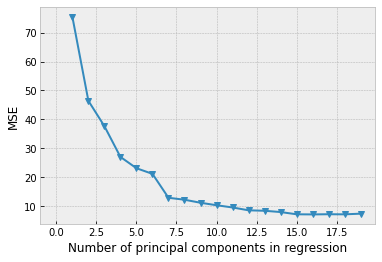

In [ ]:
pca2 = PCA()
regr = LinearRegression()

# Scale the data
X_reduced_train = pd.DataFrame(pca2.fit_transform(train_x_1))

# 10-fold CV, with shuffle
mse = []

for i in np.arange(1, 20):
    score = TimeSeriesCV(X_reduced_train.iloc[:,:i], train_y_1, 10)
    mse.append(score)

plt.plot(np.arange(1,20),np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.xlim(xmin=-1);

M = 7

In [ ]:
X_reduced_test = pca2.transform(test_x_1)[:,:7]
X_reduced_train = pca2.fit_transform(train_x_1)[:,:7]


# Train regression model on training data 
regr = LinearRegression()
regr.fit(X_reduced_train, train_y_1)

pred = regr.predict(X_reduced_test)
pred_train = regr.predict(X_reduced_train)

print("Method 1 PCA error:")
print("PCA training error: ", mean_squared_error(train_y_1, pred_train))
print("PCA testing error: ", mean_squared_error(test_y_1, pred))

Method 1 PCA error:
PCA training error:  5.016608252544074
PCA testing error:  5.1574077235104046


Method 2B

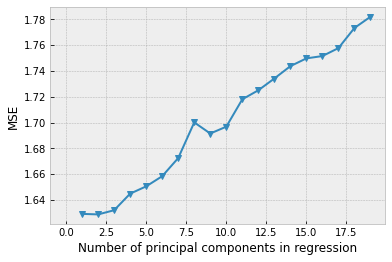

In [ ]:
pca2 = PCA()
regr = LinearRegression()

# Scale the data
X_reduced_train = pd.DataFrame(pca2.fit_transform(train_x_2B))
mse = []

for i in np.arange(1, 20):
    score = TimeSeriesCV(X_reduced_train.iloc[:,:i], train_y_2B, 10)
    mse.append(score)

plt.plot(np.arange(1,20),np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.xlim(xmin=-1);

M = 1

In [ ]:
X_reduced_test = pca2.transform(test_x_2B)[:,:1]
X_reduced_train = pca2.fit_transform(train_x_2B)[:,:1]

PCA_2B_train = X_reduced_train

# Train regression model on training data 
regr = LinearRegression()
regr.fit(X_reduced_train, train_y_2B)

pred = regr.predict(X_reduced_test)
pred_train = regr.predict(X_reduced_train)


print("Method 2B PCA error:")
print("PCA training error: ", mean_squared_error(train_y_2B, pred_train))
print("PCA testing error: ", mean_squared_error(test_y_2B, pred))



Method 2B PCA error:
PCA training error:  1.7099243097592178
PCA testing error:  1.4384292378216976


Method 3

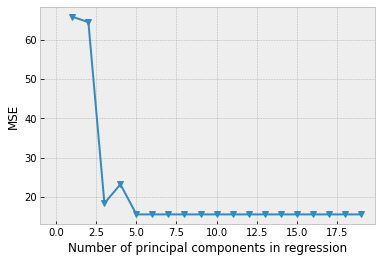

In [ ]:
pca2 = PCA()
regr = LinearRegression()

# Scale the data
X_reduced_train = pd.DataFrame(pca2.fit_transform(train_x_3))

# 10-fold CV, with shuffle
mse = []

for i in np.arange(1, 20):
    score = TimeSeriesCV(X_reduced_train.iloc[:,:i], train_y_3, 10)
    mse.append(score)


plt.plot(np.arange(1,20),np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.xlim(xmin=-1);

M = 5

In [ ]:
X_reduced_test = pca2.transform(test_x_3)[:,:5]
X_reduced_train = pca2.fit_transform(train_x_3)[:,:5]


# Train regression model on training data 
regr = LinearRegression()
regr.fit(X_reduced_train, train_y_3)

pred = regr.predict(X_reduced_test)
pred_train = regr.predict(X_reduced_train)

print("Method 3 PCA error:")
print("PCA training error: ", mean_squared_error(train_y_3, pred_train))
print("PCA testing error: ", mean_squared_error(test_y_3, pred))



Method 3 PCA error:
PCA training error:  6.982005424025309
PCA testing error:  5.6067327797468565


Method 4

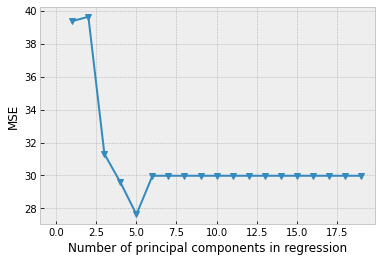

In [ ]:
pca2 = PCA()
regr = LinearRegression()

X_reduced_train = pd.DataFrame(pca2.fit_transform(train_x_4))

# 10-fold CV, with shuffle
mse = []

for i in np.arange(1, 20):
    score = TimeSeriesCV(X_reduced_train.iloc[:,:i], train_y_4, 10)
    mse.append(score)


plt.plot(np.arange(1,20),np.array(mse), '-v')
plt.xlabel('Number of principal components in regression')
plt.ylabel('MSE')
plt.xlim(xmin=-1);

M = 5

In [ ]:
X_reduced_test = pca2.transform(test_x_4)[:,:5]
X_reduced_train = pca2.fit_transform(train_x_4)[:,:5]


# Train regression model on training data 
regr = LinearRegression()
regr.fit(X_reduced_train, train_y_4)

pred = regr.predict(X_reduced_test)
pred_train = regr.predict(X_reduced_train)

print("Method 4 PCA error:")
print("PCA training error: ", mean_squared_error(train_y_4, pred_train))
print("PCA testing error: ", mean_squared_error(test_y_4, pred))



Method 4 PCA error:
PCA training error:  9.405674862831765
PCA testing error:  6.47216612756809


PCA on method 2B perform better than other method. Using first and second PCA on method 2B to build regression model has similar performance compare to ridge regression on method 2B.

In [ ]:
print(PCA_2B_train)

[[ 3.84989287]
 [-2.91257521]
 [-2.37503538]
 ...
 [-4.35419859]
 [ 5.22597881]
 [ 0.6163764 ]]


#Model 2: ARIMA model

Autoregressive Integrated Moving Average

In [ ]:
# Stationarity check
from statsmodels.tsa.stattools import adfuller

result = adfuller(train.Close)
print("F statistics: ",result[0])
print("P-value: ", result[1])

# Clearly the close price is not stationary

F statistics:  -0.4492365787558446
P-value:  0.9015478029807356


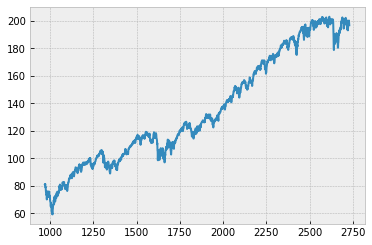

In [ ]:
# Autocorrelation Function ACF
from statsmodels.graphics.tsaplots import plot_acf
plt.plot(train.Close)

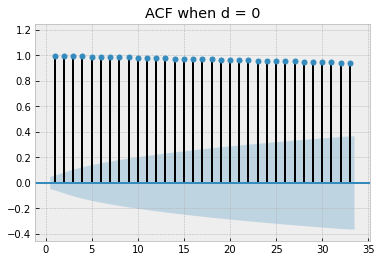

In [ ]:
plot_acf(train.Close, zero=False, auto_ylims=True, title='ACF when d = 0');

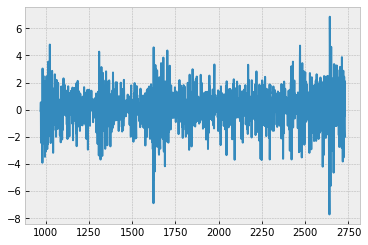

In [ ]:
# Difference once
diff1 = train.Close.diff().dropna()
plt.plot(diff1)

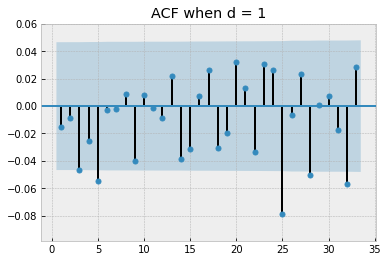

In [ ]:
plot_acf(diff1, zero=False, auto_ylims=True, title='ACF when d = 1');

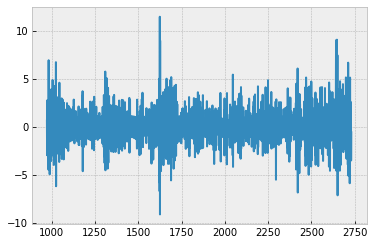

In [ ]:
# Difference twice
diff2 = train.Close.diff().diff().dropna()
plt.plot(diff2)

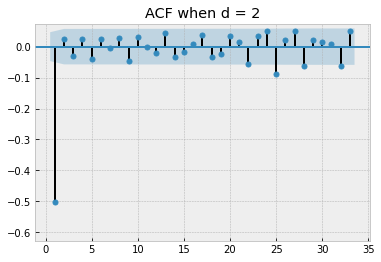

In [ ]:
plot_acf(diff2, zero=False, auto_ylims=True, title='ACF when d = 2');

In [ ]:
from pmdarima.arima.utils import ndiffs
ndiffs(train.Close, test = "adf")
# Based on ACF plots and ndiffs function, the order of differnce should be 1

1

Note that the intervals between lags in the seasonal ARIMA model are not exactly the same. However, since there is a seasonal pattern, the seasonal ARIMA models will be compared with the non-seasonal ones through cross validation.

/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/statsmodels/graphics/tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


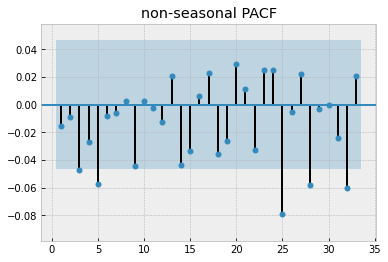

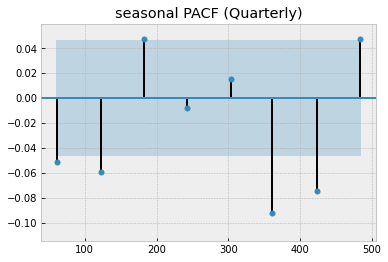

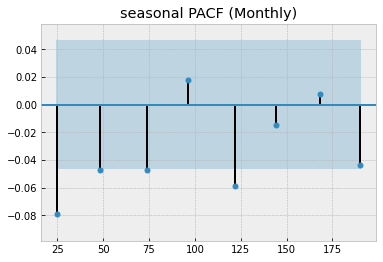

In [ ]:
# AR
from statsmodels.graphics.tsaplots import plot_pacf
# Daily
plot_pacf(diff1, zero=False, title='non-seasonal PACF', auto_ylims=True);
# Quarterly
plot_pacf(diff1, zero=False, lags=[61, 122, 182, 242, 304, 361, 423, 484], title='seasonal PACF (Quarterly)', auto_ylims=True);
# Monthly
plot_pacf(diff1, zero=False, lags=[25, 48, 74, 96, 122, 144, 168, 190], title='seasonal PACF (Monthly)', auto_ylims=True);

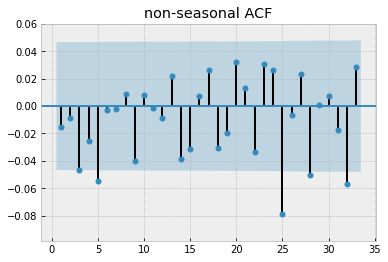

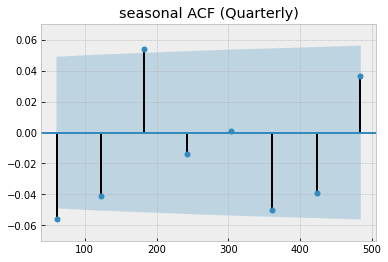

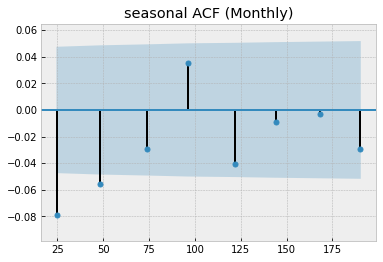

In [ ]:
# MA
# Daily
plot_acf(diff1, zero=False, title='non-seasonal ACF', auto_ylims=True);
# Quarterly
plot_acf(diff1, zero=False, lags=[61, 122, 182, 242, 304, 361, 423, 484], title='seasonal ACF (Quarterly)', auto_ylims=True);
# Monthly
plot_acf(diff1, zero=False, lags=[25, 48, 74, 96, 122, 144, 168, 190], title='seasonal ACF (Monthly)', auto_ylims=True);

In [ ]:
from pmdarima.arima.utils import nsdiffs
D4 = nsdiffs(train['Close'],
            m=4,
            max_D=12,
            test='ch')
D12 = nsdiffs(train['Close'],
            m=12,
            max_D=12,
            test='ch')
print(D4)
print(D12)

0
0


In [ ]:
import statsmodels.api as sm

model1 = sm.tsa.arima.ARIMA(train.Close, order = (1,1,1))
model2 = sm.tsa.arima.ARIMA(train.Close, order = (1,1,1), seasonal_order = (3,0,1,4))
model3 = sm.tsa.arima.ARIMA(train.Close, order = (1,1,1), seasonal_order = (2,0,1,4))
model4 = sm.tsa.arima.ARIMA(train.Close, order = (1,1,1), seasonal_order = (3,0,2,12))
model5 = sm.tsa.arima.ARIMA(train.Close, order = (1,1,1), seasonal_order = (1,0,2,12))

In [ ]:
from sklearn.metrics import mean_squared_error
from math import floor
# 10-fold cv
def arima_cv(order, seasonal_order):
  train_set_length = len(train['Close'])
  total_mse = 0
  offset = floor(train_set_length / 10)
  for i in range(10):
    train_start = i * offset
    train_end = train_start + offset
    validate_end = train_end + offset
    subset = train.Close[train_start:validate_end]
    train_set = train.Close[train_start:train_end]
    validation_set = train.Close[train_end:validate_end]
    model = sm.tsa.arima.ARIMA(train_set, order = order, seasonal_order = seasonal_order)
    fitted = model.fit()
    applied = fitted.apply(subset, refit=False)
    predicted = applied.predict()[offset:offset*2]
    total_mse += mean_squared_error(validation_set, predicted)
  return total_mse / 10

In [ ]:
selected_order = (1,1,1)
model1_cv_score = arima_cv(selected_order, (0,0,0,0))
model2_cv_score = arima_cv(selected_order, (3,0,1,4))
model3_cv_score = arima_cv(selected_order, (2,0,1,4))
model4_cv_score = arima_cv(selected_order, (3,0,2,12))
model5_cv_score = arima_cv(selected_order, (1,0,2,12))

In [ ]:
print(model1_cv_score)
print(model2_cv_score)
print(model3_cv_score)
print(model4_cv_score)
print(model5_cv_score)

1.8712577561604937
2.0180736896227653
1.9958017001249861
1.972895846843027
1.9607676839913395


In [ ]:
# fit chosen value
arima_result = model1.fit()
print(arima_result.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


                               SARIMAX Results                                
Dep. Variable:                  Close   No. Observations:                 1761
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -2996.506
Date:                Sun, 27 Nov 2022   AIC                           5999.012
Time:                        05:30:27   BIC                           6015.432
Sample:                             0   HQIC                          6005.080
                               - 1761                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8699      0.072     12.060      0.000       0.729       1.011
ma.L1         -0.8990      0.066    -13.525      0.000      -1.029      -0.769
sigma2         1.7633      0.039     45.004      0.0

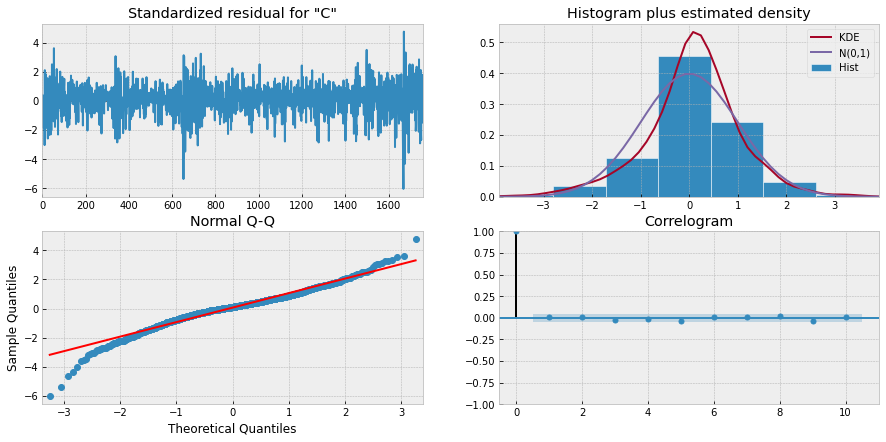

In [ ]:
arima_result.plot_diagnostics(figsize=(15,7));

From the above plots, the residuals are slightly skewed, overall, it follows normal distribution. The assumption that residuals follow normal distribution is met.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Text(0.5, 1.0, 'Forecast vs Actuals')

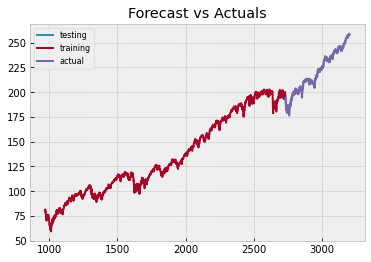

In [ ]:
from statsmodels.graphics.tsaplots import plot_predict
# predict
# whole data set used to test (since prediction requires historical data)
test_set = pd.Series(train['Close'])
test_set = test_set.append(test['Close'])
result_applied = arima_result.apply(test_set, refit=False)
training_set_predicted = result_applied.predict()[:len(train.index)]
arima_predicted = result_applied.predict()[len(train.index):]
# plot
plt.plot(arima_predicted, label='testing')
plt.plot(train.Close, label='training')
plt.plot(test['Close'], label='actual')
plt.legend(loc='upper left', fontsize=8)
plt.title('Forecast vs Actuals')

In [ ]:
from sklearn.metrics import mean_squared_error
# calculate training error
training_error = mean_squared_error(train['Close'], training_set_predicted)
print(training_error)
# calculate testing error
testing_error = mean_squared_error(test['Close'], arima_predicted)
print(testing_error)

5.486655113901869
1.9030343523744608


In [ ]:
# Auto-arima: used in 10 etfs
from pmdarima.arima import auto_arima
import statsmodels.api as sm

def test_auto_arima(train, test):
  # select parameters using the pmdarima library
  fitted_arima_model = auto_arima(train['Close']).fit(y=train['Close'])
  selected_order = fitted_arima_model.get_params()['order']
  selected_seasonal_order = fitted_arima_model.get_params()['seasonal_order']

  # fit model using the statsmodel library
  model = sm.tsa.arima.ARIMA(train['Close'], order = selected_order, 
                             seasonal_order = selected_seasonal_order)
  fitted_model = model.fit()
  test_set = pd.Series(train['Close'])
  test_set = test_set.append(test['Close'])
  result_applied = fitted_model.apply(test_set, refit=False)

  # make predictions using the statsmodel library
  train_set_predictions = result_applied.predict()[:len(train.Close)]
  test_set_predictions = result_applied.predict()[len(train.Close):]
  # plot results
  plt.figure(figsize=(12,5), dpi=100)
  plt.plot(range(0, len(test_set_predictions)), test_set_predictions, label='forecast')
  plt.plot(range(0, len(test['Close'])), test['Close'], label='actual')
  plt.title('Forecast vs Actuals')
  plt.legend(loc='upper left', fontsize=8)
  plt.show()
  # calculate mse
  training_error = mean_squared_error(train['Close'], train_set_predictions)
  testing_error = mean_squared_error(test['Close'], test_set_predictions)
  return training_error, testing_error

In [ ]:
test_auto_arima(train, test)

# Model 3: LSTM model

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Bidirectional
from numpy import array
import numpy as np
from sklearn.metrics import mean_squared_error

*3.1* Vanilla LSTM vs Stacked LSTM vs Bidirectional LSTM

Vanilla LSTM is a LSTM model that has a single hidden layer of LSTM units, and an output layer used to make prediction. 

Multiple hidden LSTM layers can be stacked one on top of another in what is referred to as a Stacked LSTM model.

On some sequence prediction problems, it can be beneficial to allow the LSTM model to learn the input sequence both forward and backwards and concatenate both interpretations. This is called bidirectional lstm.

In [ ]:
# This functions use method 1 to generate the train and test set in the format needed to run lstm.
# ie for a time series [x1, x2, x3, ... , xn], split into (assuming n_steps = 3)
# X [[x1, x2, x3], [x2, x3, x4], ... [xn-2, xn-1, xn]]
# Y [x4, x5, ... xn]

def generate_data_for_lstm1(n_steps, train, test):
  # We use method 1 to generate data for lstm. Choose timestep = 3. 
  train_1stm = method1(train, n_steps)
  test_1stm = method1(test, n_steps)

  train_x_1stm_arr = array(getX(train_1stm).values.tolist())
  train_y_1stm_arr = array(getY(train_1stm).values.tolist())
  test_x_1stm_arr = array(getX(test_1stm).values.tolist())
  test_y_1stm_arr = array(getY(test_1stm).values.tolist())
  # print(train_x_1stm_arr, train_y_1stm_arr)

  return train_x_1stm_arr, train_y_1stm_arr, test_x_1stm_arr, test_y_1stm_arr

def generate_data_for_lstm2(n_steps, train, test):
  # We use method 2B to generate data for lstm. Choose timestep = 3. 
  train_1stm = method2B(train, n_steps + 1)
  test_1stm = method2B(test, n_steps + 1)

  train_x_1stm_arr = array(getX(train_1stm).values.tolist())
  train_y_1stm_arr = array(getY(train_1stm).values.tolist())
  test_x_1stm_arr = array(getX(test_1stm).values.tolist())
  test_y_1stm_arr = array(getY(test_1stm).values.tolist())

  return train_x_1stm_arr, train_y_1stm_arr, test_x_1stm_arr, test_y_1stm_arr

In [ ]:
# This function takes in a trained lstm model and predict the output from a test set
def make_predictions(lstm_model, test_x):
  test_x = test_x.reshape(test_x.shape[0], test_x.shape[1], 1)
  # print('testx', test_x)

  predictions_lstm = lstm_model.predict(test_x, verbose=0)
  predictions_lstm = list(np.concatenate(predictions_lstm).flat)
  return predictions_lstm

In [ ]:
# This two function are used for visualisation purposes

# plot both forecast and actual
def plot_forecast_vs_actual_graph(predictions, test_actual, n_steps, lstm_type):

  # plot forecast vs actual
  plt.figure(figsize=(20, 8), dpi=200)
  # plt.plot(train.Close, label='training')
  plt.plot(test_actual, label='actual')
  plt.plot([i for i in range(len(test_actual))], predictions, label='forecast')
  plt.title('Forecast vs Actuals (' + str(n_steps) + ' days version) - ' + str(lstm_type) + " model")
  plt.legend(loc='upper left', fontsize=8)
  plt.show()


# plot the difference betwee forecast and actual and return an average
def plot_difference_graph(predictions, test_actual, n_steps, lstm_type, n_lstm_unit, epoch=50, plot=True):
  # print('testy', predictions)
  # print('trainy', test_actual)
  # predictions = predictions[:-n_steps]
  # test_actual = test_actual[n_steps:]
  mse = mean_squared_error(test_actual, predictions)
  diff = list(predictions - test_actual)

  # difference = predictions - test_actual.Close[n_steps:]
  # average = sum(map(abs, difference)) / len(difference)

  if plot:
    plt.figure(figsize=(20, 8), dpi=200)
    plt.ylim(-10, 10)
    plt.annotate('MSE = ' + str(round(mse, 3)), xy=(1, 0), xycoords='axes fraction')
    plt.plot(diff, label='difference')
    plt.title('Difference graph for n_steps = ' + str(n_steps) + " n_lstm_unit = " + str(n_lstm_unit) + " epoch = " + str(epoch) + " "+ str(lstm_type) + "model")
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

  return diff, mse

In [ ]:
# This functions will first generate data for lstm, and train it on the given n_steps, n_lstm_units, n_features
def train_lstm_model(n_steps, n_lstm_units, n_features, train, test, lstm_type="vanilla", epoch=50, method='2'):
  
  # eg n_feature = 1
  # convert X [[x1, x2, x3], [x2, x3, x4], ... [xn-2, xn-1, xn]] to [[[x1], [x2], [x3]],  [[x2], [x3], [x4]] ... [[xn-2], [xn-1], [xn]]]
  
  # train_x_1stm, train_y_1stm, test_x_1stm, test_y_1stm = generate_data_for_lstm1(n_steps, train, test)

  if method=='1':
    train_x_1stm, train_y_1stm, test_x_1stm, test_y_1stm = generate_data_for_lstm1(n_steps, train, test)

  if method=='2':
    train_x_1stm, train_y_1stm, test_x_1stm, test_y_1stm = generate_data_for_lstm2(n_steps, train, test)

  train_x_1stm_arr = train_x_1stm.reshape(train_x_1stm.shape[0], train_x_1stm.shape[1], n_features)

  # print(train_x_1stm_arr)
  model = Sequential()
  # define model
  if (lstm_type == "vanilla"):
    model.add(LSTM(n_lstm_units, activation='relu', input_shape=(n_steps, n_features)))
  elif lstm_type == "stacked":
    # need to abstract the num of layer out as a argument ( to show overfitting)
    model.add(LSTM(n_lstm_units, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
    model.add(LSTM(n_lstm_units, activation='relu'))

  elif lstm_type == "bidirectional":
    model.add(Bidirectional(LSTM(n_lstm_units, activation='relu'), input_shape=(n_steps, n_features)))
  else: 
    pass

  model.add(Dense(1))
  # model.summary()
  model.compile(optimizer='adam', loss='mse')
  # print(len(train_x_1stm_arr), len(train_y_1stm))
  # print('trainx', train_x_1stm_arr)
  # print('trainy', train_y_1stm)

  model.fit(train_x_1stm, train_y_1stm,validation_split=0.2, epochs=epoch, verbose=0)

  return model, train_x_1stm, train_y_1stm, test_x_1stm, test_y_1stm

  # model.add(Dense(1))
  # model.compile(optimizer='adam', loss='mse')
  # model.fit(train_x_1stm_arr, train_y_1stm, epochs=200, verbose=0)


In [ ]:
# This function ties everythign up
def run_model(n_steps, n_lstm_unit, n_features, train, test, lstm_type="vanilla", plot_forecast=False, epoch=50, plot_diff=True, meth='2'):
  lstm_model, train_x_1stm_arr, train_y_1stm_arr, test_x_1stm_arr, test_y_1stm_arr = train_lstm_model(n_steps, n_lstm_unit, n_features, train, test, lstm_type, epoch=epoch, method=meth)
  # print("len", len(test_x_1stm_arr))
  # predictions = make_predictions(lstm_model, test_x_1stm_arr)
  # print(test_x_1stm_arr)
  predictions = make_predictions(lstm_model, test_x_1stm_arr)
  # print(len(test_x_1stm_arr))
  # print(predictions)
  # print(len(predictions))
  # print(test_y_1stm_arr)
  # print(len(test_y_1stm_arr))

  # print(test_x_1stm_arr, len(test_x_1stm_arr))
  # print(len(predictions))
  # print(test_y_1stm_arr)

  if plot_forecast:
    plot_forecast_vs_actual_graph(predictions, test_y_1stm_arr, n_steps, lstm_type)

  diff, mse = plot_difference_graph(predictions, test_y_1stm_arr, n_steps, lstm_type, n_lstm_unit, epoch, plot=plot_diff)

  return diff, mse

# Section 3.1 Tuning Epoch

We fix n_step = 3, n_lstm_unit = 50 

Test out epoch value from 0 to 200, increment by 10 each for all three models. 

This aims to find a GOOD enough epoch value to prevent overfitting

In [ ]:
# TUNE FOR EPOCH 
# FIX NSTEPS, NLSTMUNIT

# Some valuse to save time
N_STEPS = [3]
N_LSTM_UNIT = [100]

# All values
# EPOCHS = [i for i in range(0, 310, 5)]

# Some value to save time
EPOCHS = [i for i in range(100, 200, 10)]
# EPOCHS = [500]

LSTM_TYPE = ["vanilla"]
N_FEATURES = 1


TRAIN = df[(df.Date >= startDay) & (df.Date <= midDay)]
TEST = df[df.Date > midDay]



all_dict = {}
all_dict["vanilla"] = []
all_dict["stacked"] = []
all_dict["bidirectional"] = []

for STEP in N_STEPS:
  for lstm in LSTM_TYPE:
    for LSTMUNIT in N_LSTM_UNIT:
      for EPOCH in EPOCHS:
        diff, mse = run_model(STEP, LSTMUNIT, N_FEATURES, TRAIN, TEST, lstm, plot_forecast=False, epoch=EPOCH, plot_diff=False, meth='1')
        all_dict[str(lstm)].append(mse) 

        print(lstm, EPOCH, mse)

vanilla 100 2.712587229150949
vanilla 110 2.061625614377115
vanilla 120 2.019963551626783
vanilla 130 1.9085975420711732
vanilla 140 2.1392327183504385
vanilla 150 2.0742004119333215
vanilla 160 2.729711386247377
vanilla 170 4.877730005489887
vanilla 180 3.7605728587846436
vanilla 190 3.4134766249807766


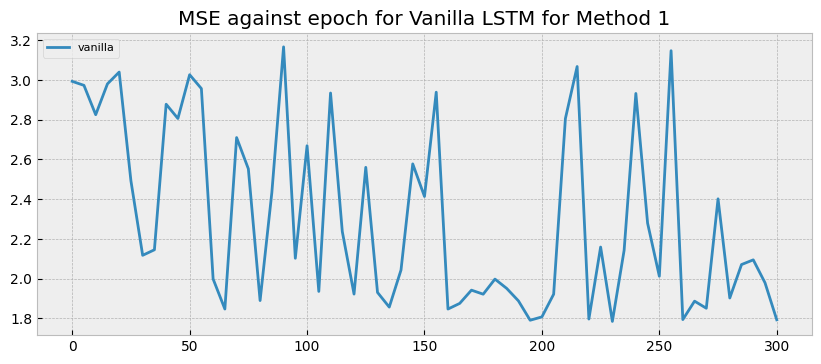

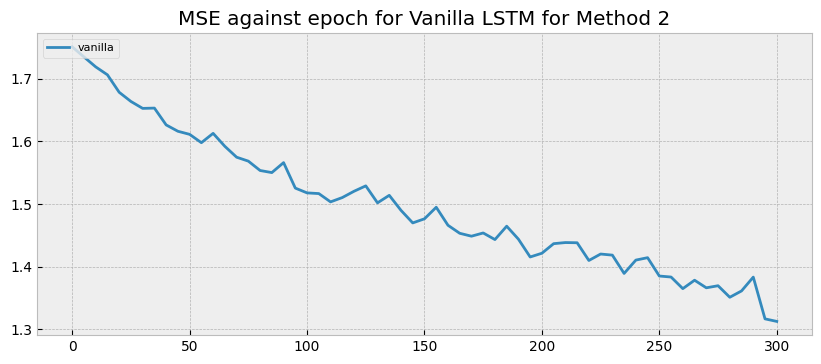

In [ ]:
# all_dict_m2 = {'vanilla': [1.7656774836067377, 1.759699691901776, 1.7593954152201507, 1.7659646175543102, 1.7698894860813623, 1.7618939091674553, 1.7662222727236327, 1.7726176493216452, 1.771288360244988, 1.7690804630833306, 1.7772782392180149, 1.769509320307091, 1.7664007869638703, 1.763389618085014, 1.767036038377668, 1.7753659155751653, 1.7740222606297562, 1.809419012100435, 1.786868316796058, 1.8111048408500183, 1.7807620879189627, 1.8285764473921127, 1.8117294593158986, 1.8373846140424428, 1.8482379489256824, 1.82756496817046, 1.8583109757975669, 1.8753002485712584, 1.839586526209146, 1.8827700476953118, 1.8693740399025236, 1.894002597273686, 1.866276247301558, 1.9185867604382223, 1.9332781927144076, 1.8770171489723622, 1.9136666446401749, 1.9173386408440058, 1.9409695520172485, 1.9150028339496572, 1.9385313026018067, 1.9215152652362855, 1.8803958212254699, 1.8698171407459423, 1.911572752160768, 1.9116781955597095, 1.9521402626328879, 1.8941185300251642, 2.0043049048445205, 1.9216790050468269, 1.9872363271726092, 1.9473046573674828, 2.0142344845215923, 1.958488101194213, 1.9748206296949697, 1.9677122331440249, 2.0156932918734105, 2.0490417818801863, 2.006117854390915, 1.9659356895880071, 2.0073175349282044, 1.9943810696306135, 1.969026884495389, 1.9671824241351645, 1.9852795447655416, 2.0152365547726303, 2.027542186683085, 2.04776633942363, 2.0215600094902304, 2.0257324672972814, 2.0208045984782985, 1.996444306073559, 2.0055051618439923, 2.0106063901448175, 1.9574755946566869], 'stacked': [], 'bidirectional': []}
all_dict_m1 = {'vanilla': [17343.537684718394, 8176.849350990719, 29.20992853868485, 25.329777245445143, 6.063697479539374, 3.531359518275619, 3.7044900926726103, 3.3597090881583385, 3.144697361641802, 3.1184631920629844, 4.3219866298240905, 3.063659606490106, 3.6677384223394895, 3.4399644457895002, 3.017390927163831, 7.909378404140533, 3.113571782022762, 3.9362144831830084, 3.0558743197044107, 4.450302204185851, 3.3278022818707065, 4.37031591692883, 3.3604748301346006, 3.24377984595719, 3.1544517197298996, 5.068041518744183, 3.0247843446891376, 4.237399465148138, 2.9153682503106806, 3.102573357088012, 4.413725548251846, 3.558825875006978, 3.4029632379863677, 5.046591156689014, 3.3561112140859235, 4.524616314039861, 4.189216183960871, 4.157941708127043, 5.49421284530626, 3.3314947738493403, 5.286893429064947, 3.5429308317904633, 3.3484746120977364, 3.577867414660126, 5.267361490178318, 4.071500588326409, 3.869961044772482, 2.965520122311042, 3.1066311309907606, 5.586183988104783, 2.79104564318997, 3.1286384368040463, 2.9504983460580307, 3.0034956221789053, 3.2833652426932627, 3.446199183108572, 3.082372681268244, 3.0914110882932313, 3.944880918378058, 3.7124110859810195, 3.6244729184248774, 3.930762210323425, 3.073556958896156, 3.4375734750819356, 3.5232577969585, 2.7702631972655083, 5.936669790901768, 3.4102323908546723, 3.366850263002755, 3.1495098147259846, 3.2408363670506524, 3.527207193031526, 3.470232171744809, 3.166977735300879, 2.958103981941998], 'stacked': [], 'bidirectional': []}
all_dict_m1 = {'vanilla': [18320.75530061082, 2.9935289585319445, 2.9733081816531266, 2.8254486766542284, 2.980727359117203, 3.040307573964875, 2.4925191030308445, 2.117196265558768, 2.1450500429748756, 2.8783040714219013, 2.8064406980668593, 3.0269621076655566, 2.9570640243382473, 1.9978924139876209, 1.846590788479936, 2.7103111452999227, 2.5528270622630167, 1.8892817162504298, 2.432716499177061, 3.167254032337991, 2.1023077050540775, 2.669216251533634, 1.935274827514722, 2.9347692135249237, 2.2370452420040303, 1.921878046332518, 2.5603846365165794, 1.9301991385874897, 1.8563344681141734, 2.043014399350926, 2.5777677791784694, 2.4135551106964965, 2.9389091098784355, 1.8464876286927068, 1.8749935963346218, 1.9416794797711474, 1.9213607451464372, 1.9974174623668117, 1.9505151165417058, 1.8877524634690066, 1.7901085862210742, 1.8069762842615822, 1.921371155947202, 2.8060059650870075, 3.0682804952768246, 1.7960729568979918, 2.158834838566991, 1.784205895105724, 2.1418082175741757, 2.932520404394483, 2.279231879709597, 2.0116354896160256, 3.1478707417776066, 1.7934815353295281, 1.8862622628946644, 1.8505475339194521, 2.4017019047151056, 1.9021516400441687, 2.0706231457265445, 2.09431005146614, 1.9787551963201746, 1.7923635504231699], 'stacked': [], 'bidirectional': []}
all_dict_m2 = {'vanilla': [1.76937072738841, 1.7506096885854967, 1.7345785164011431, 1.7186799912371709, 1.7059921667147233, 1.6781464576742868, 1.6634801155866925, 1.6524348535222169, 1.652893202419591, 1.6260547170768789, 1.6159183986377925, 1.6109902181680094, 1.597685088174696, 1.6125779563045892, 1.5918668132667362, 1.5745310949489988, 1.5682364752573406, 1.553319778552387, 1.5499716116706863, 1.5658668805028193, 1.5252104375757014, 1.5175677984940386, 1.51648277494263, 1.5032211558921689, 1.5101166732746727, 1.5201647033045862, 1.528790242691407, 1.5016858571018914, 1.5136896824187307, 1.4897047386313627, 1.469659571483032, 1.476221861121292, 1.4946605805640665, 1.4659095695141244, 1.4531080470425897, 1.448467057246564, 1.4536196908462855, 1.4430906770268144, 1.464420389698933, 1.4437186952329037, 1.4152856652616301, 1.421274575315884, 1.4365389747400477, 1.4383103717463057, 1.4379934323554293, 1.4096989498986243, 1.4200054458612597, 1.4182484055942095, 1.3890474052357478, 1.4103215193521492, 1.4141754430095859, 1.3849021619010702, 1.383285377937959, 1.3647758012882747, 1.3782101980336157, 1.3660906332007694, 1.3694093244298142, 1.3510035275278602, 1.3611105864185793, 1.3831513741942467, 1.3165313963643719, 1.3124696156403732], 'stacked': [], 'bidirectional': []}


all_dict1 = all_dict_m1
all_dict2 = all_dict_m2

vanilla1 = all_dict1["vanilla"][1:]
vanilla2 = all_dict2["vanilla"][1:]
stacked = all_dict1["stacked"][1:]
bidirectional = all_dict1["bidirectional"][2:]

plt.figure(figsize=(10, 4), dpi=100)
plt.plot([5*i for i in range(0, len(vanilla1))], vanilla1, label='vanilla')
plt.title("MSE against epoch for Vanilla LSTM for Method 1")
plt.legend(loc='upper left', fontsize=8)
plt.show()

plt.figure(figsize=(10, 4), dpi=100)
plt.plot([5*i for i in range(0, len(vanilla2))], vanilla2, label='vanilla')
plt.title("MSE against epoch for Vanilla LSTM for Method 2")
plt.legend(loc='upper left', fontsize=8)
plt.show()


# plt.figure(figsize=(10, 4), dpi=100)
# plt.plot(stacked,'o', label='stacked')
# plt.title("MSE against nstep for stacked LSTM")
# plt.legend(loc='upper left', fontsize=8)
# plt.show()

# plt.figure(figsize=(10, 4), dpi=100)
# plt.plot(bidirectional,'o', label='bidirectional')
# plt.title("MSE against nstep for bidirectional LSTM")
# plt.legend(loc='upper left', fontsize=8)
# plt.show()

(3, 25, 0)


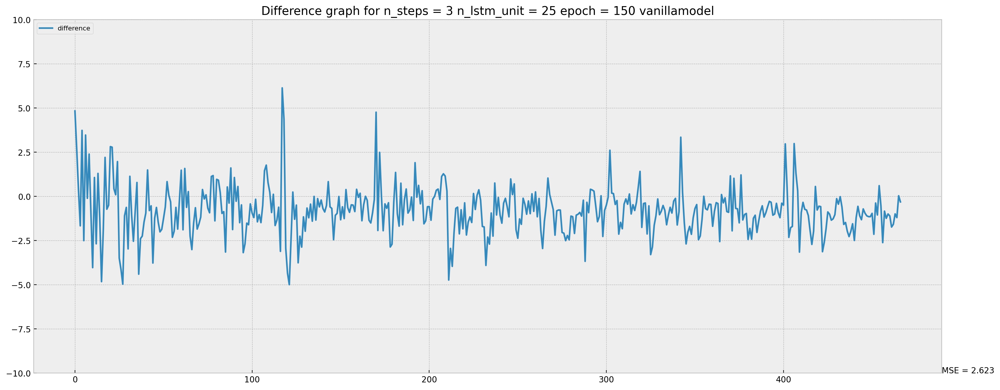

(3, 25, 1)


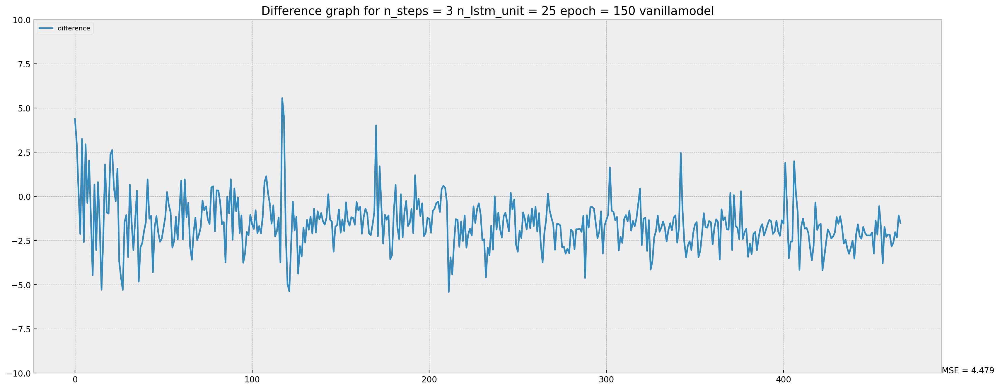

(3, 25, 2)


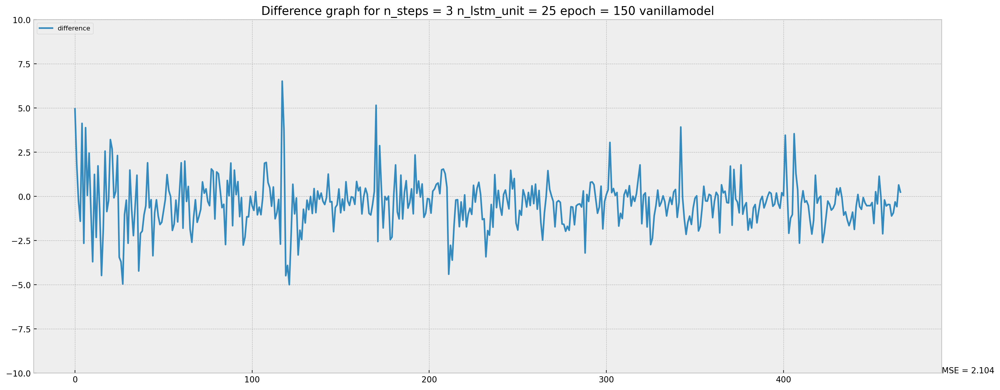

(3, 25, 3)


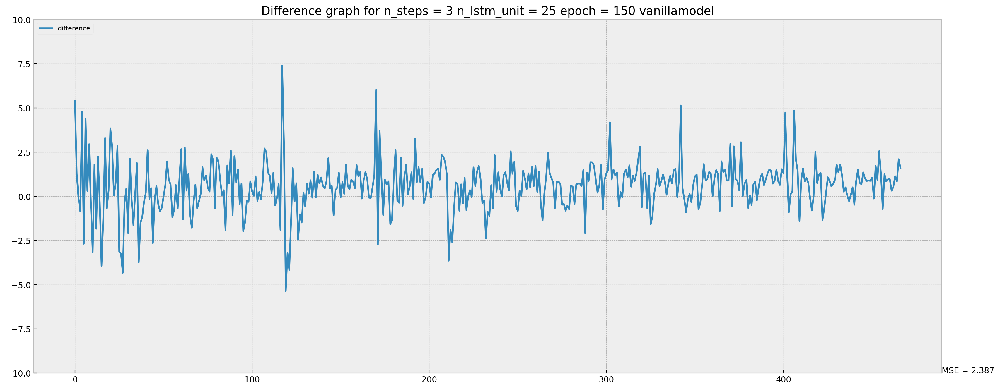

(3, 25, 4)


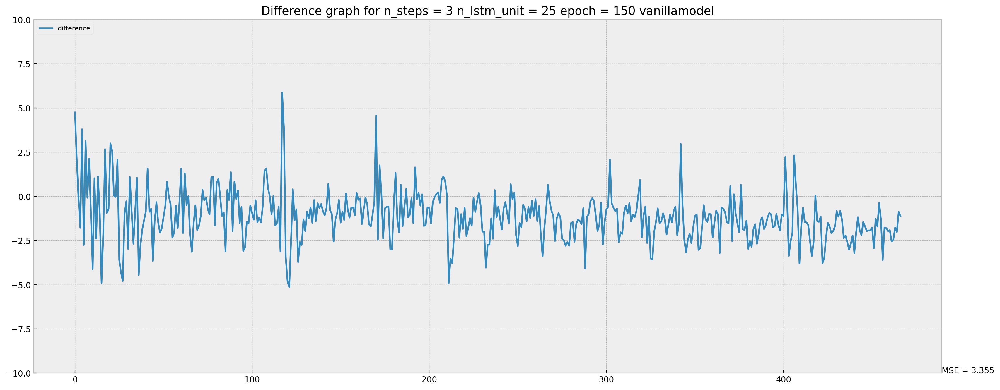

(3, 50, 0)


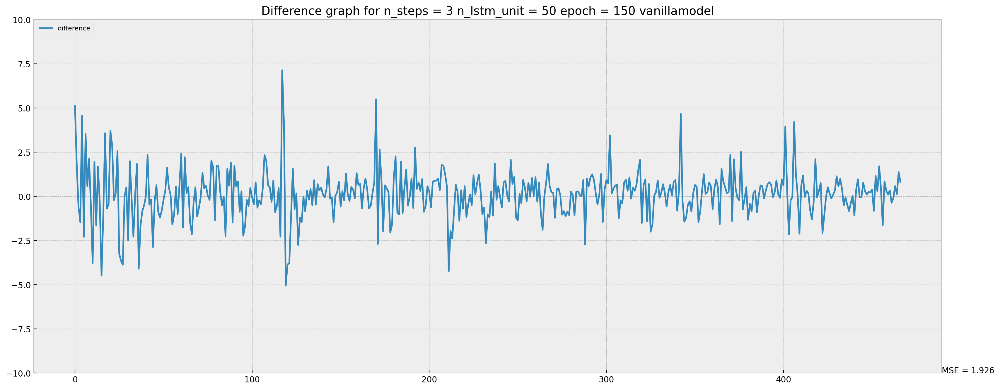

(3, 50, 1)


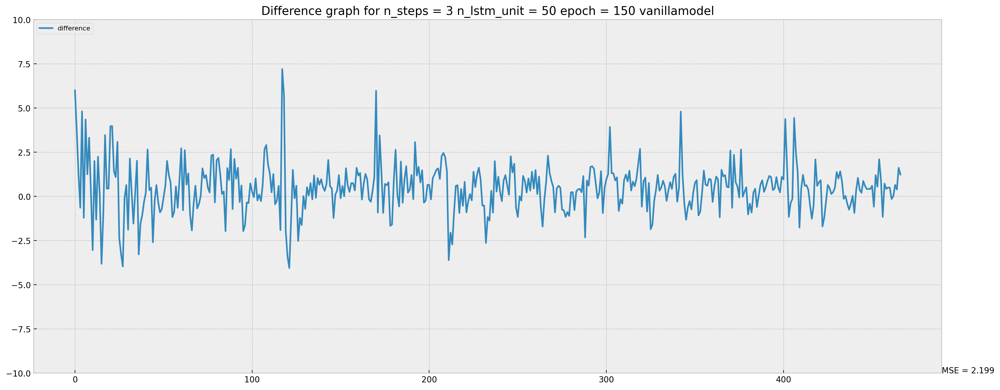

(3, 50, 2)


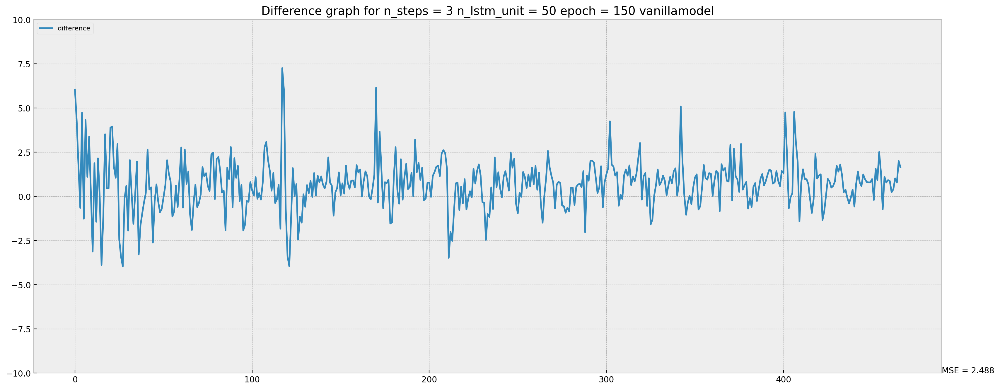

(3, 50, 3)


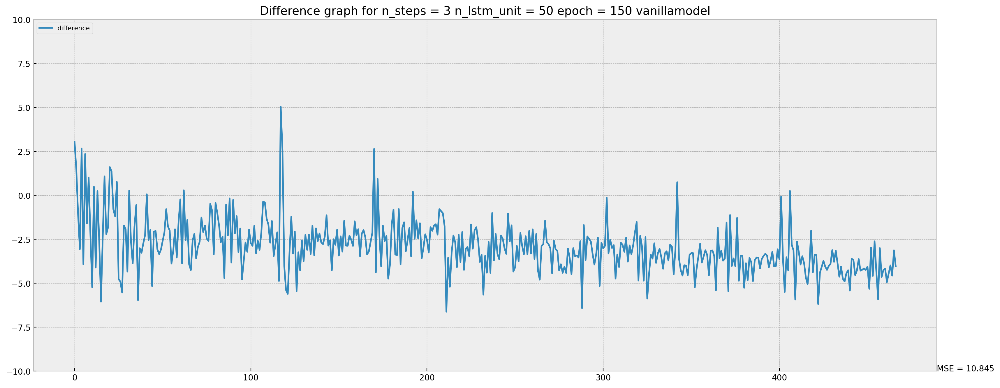

(3, 50, 4)


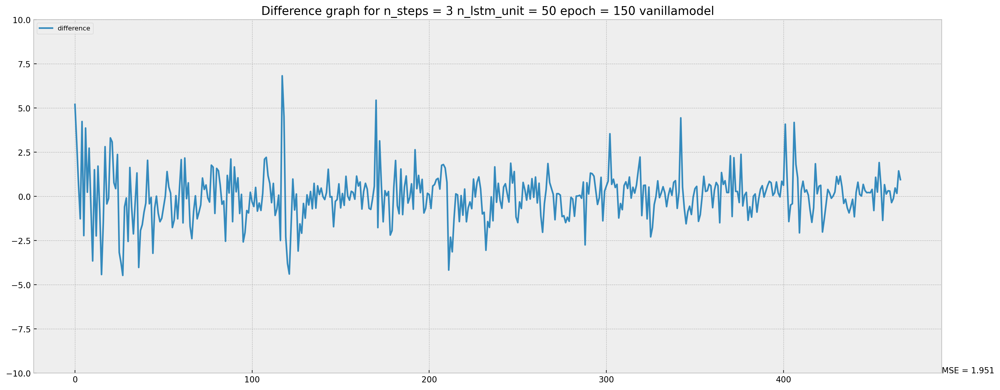

(5, 25, 0)


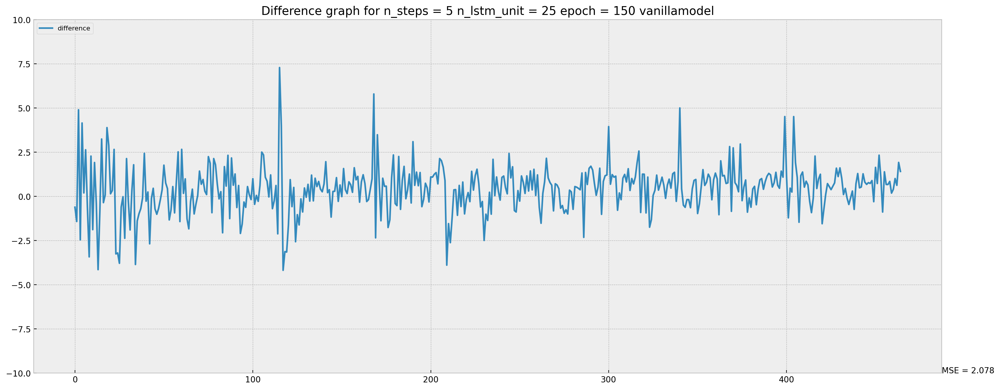

(5, 25, 1)


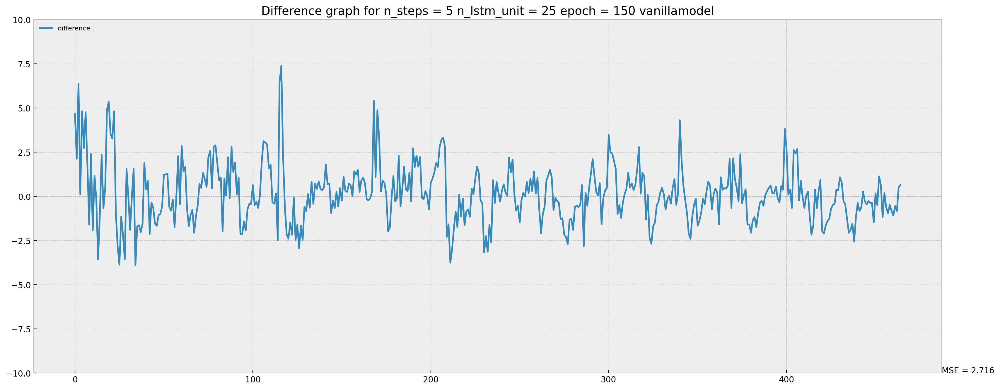

(5, 25, 2)


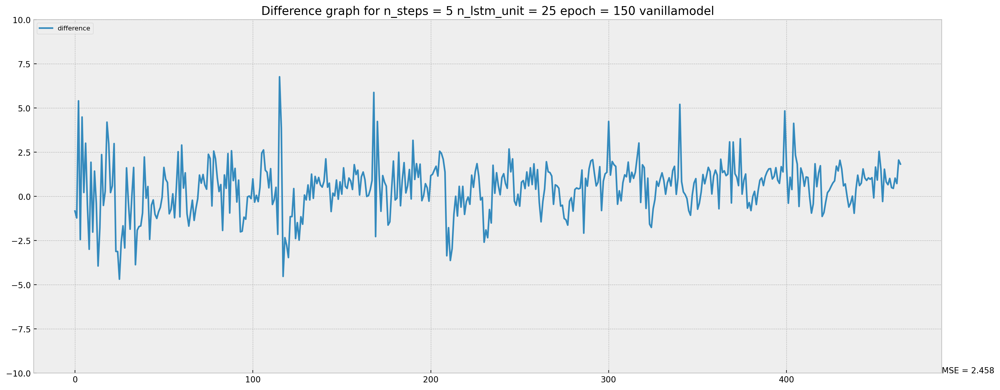

(5, 25, 3)


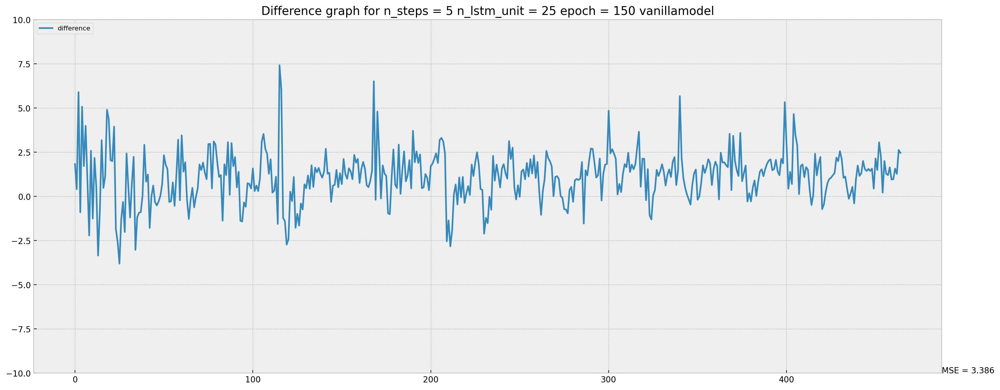

(5, 25, 4)


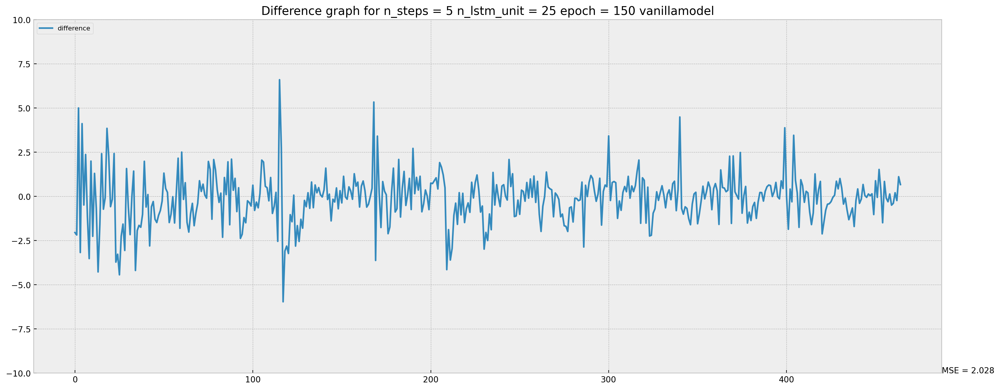

(5, 50, 0)


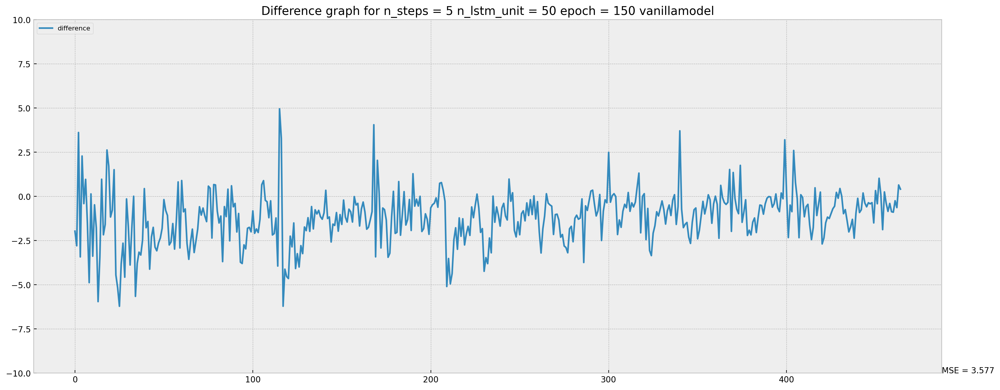

(5, 50, 1)


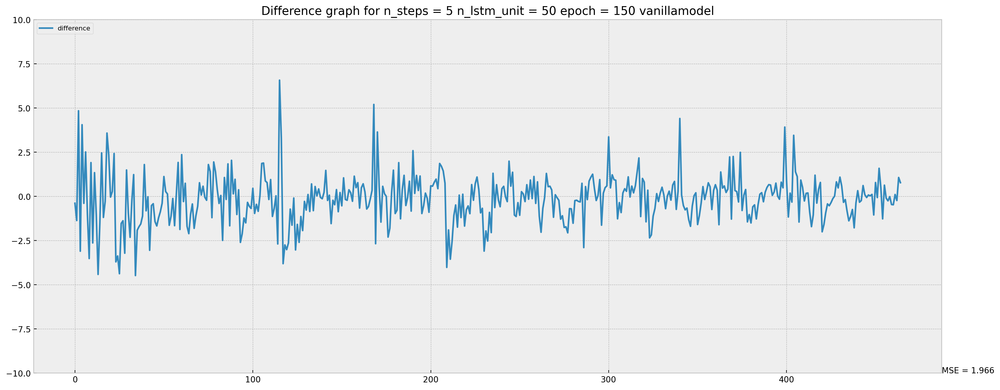

(5, 50, 2)


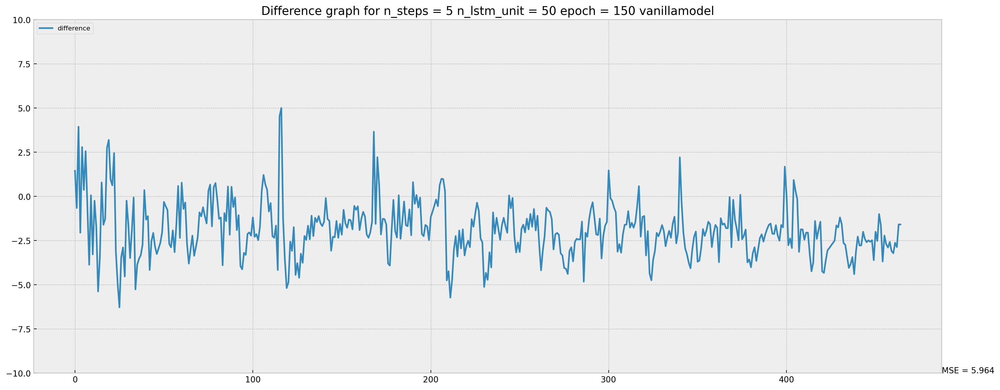

(5, 50, 3)


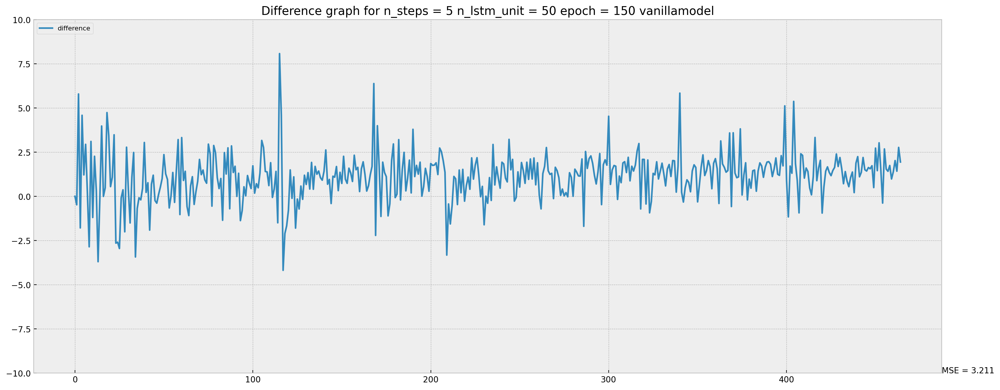

(5, 50, 4)


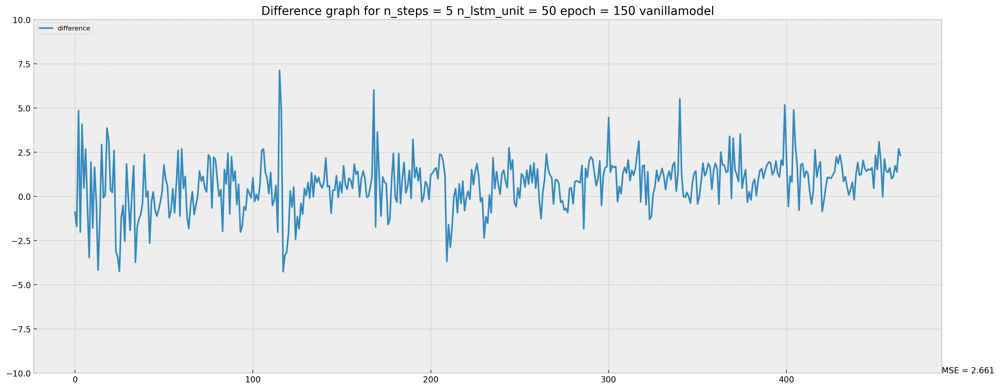

In [ ]:
# Vanilla Method 1
# https://www.investopedia.com/ask/answers/122414/what-are-most-common-periods-used-creating-moving-average-ma-lines.asp#:~:text=Common%20Moving%20Averages%20Periods&text=For%20identifying%20significant%2C%20long%2Dterm,averages%20are%20the%20most%20common.

# All values
# N_STEPS = [3, 5, 7, 10, 14, 20]
# N_LSTM_UNIT = [25, 50, 75, 100]

# Some Values
N_STEPS = [3, 5]
N_LSTM_UNIT = [25, 50]

LSTM_TYPE = ["vanilla"]
N_FEATURES = 1


TRAIN = df[(df.Date >= startDay) & (df.Date <= midDay)]
TEST = df[df.Date > midDay]

vanilla_mse_error_dict= {}
vanilla_diff_dict = {}

for STEP in N_STEPS:
  for lstm in LSTM_TYPE:
    for LSTMUNIT in N_LSTM_UNIT:
      for i in range(5):
        print((STEP, LSTMUNIT, i))
        diff, mse = run_model(STEP, LSTMUNIT, N_FEATURES, TRAIN, TEST, lstm, plot_forecast=False, epoch=150, plot_diff=True, meth='1')

        if (lstm, STEP, LSTMUNIT) not in vanilla_mse_error_dict:
          vanilla_mse_error_dict[(lstm, STEP, LSTMUNIT)] = [mse]
        else:
          vanilla_mse_error_dict[(lstm, STEP, LSTMUNIT)].append(mse)

        # vanilla_diff_dict[(lstm, STEP, LSTMUNIT)] = diff


In [ ]:
print(vanilla_mse_error_dict)

{('vanilla', 3, 25): [2.622728284254523, 4.479290356597598, 2.10437442865139, 2.387064698951946, 3.3549063143463775], ('vanilla', 3, 50): [1.9256947837825236, 2.1988467909711598, 2.48806544096269, 10.845372626553202, 1.9509421482453293], ('vanilla', 5, 25): [2.078471633677745, 2.7155824801991173, 2.4584178045297937, 3.3858950335147515, 2.028444058923435], ('vanilla', 5, 50): [3.5771594321847564, 1.9656738998748962, 5.964471471723893, 3.2110620202187254, 2.661084869905609]}


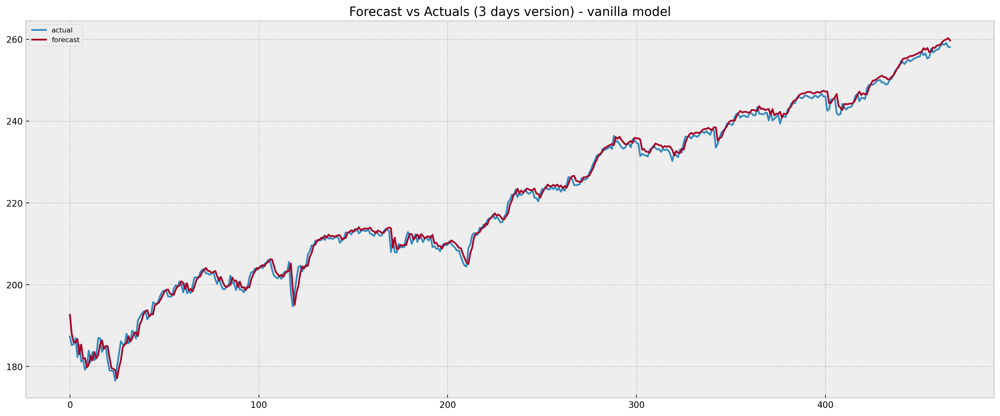

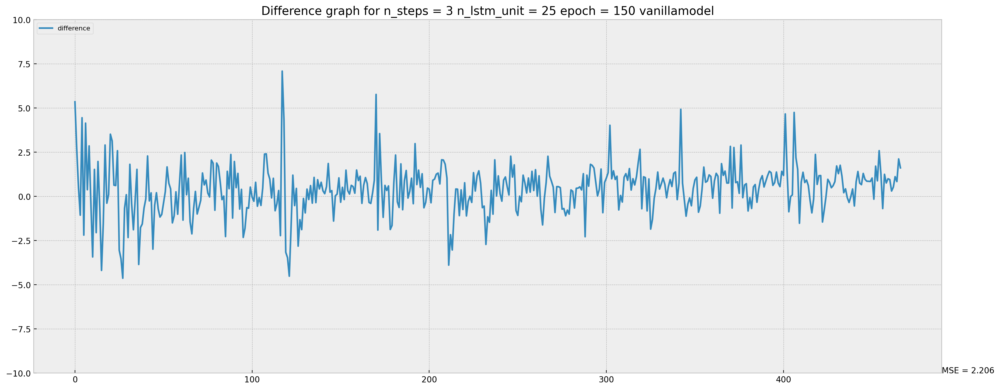

In [ ]:
# THIS IS THE FINAL RUN WITH ALL THE TUNED PARAMETER for method 1 

train_m1 = df[(df.Date >= startDay) & (df.Date <= midDay)]
test_m1 = df[df.Date > midDay]
 
diff, mse = run_model(3, 25, 1, train_m1, test_m1, "vanilla", plot_forecast=True, epoch=150, plot_diff=True, meth='1')


(14, 75, 0)


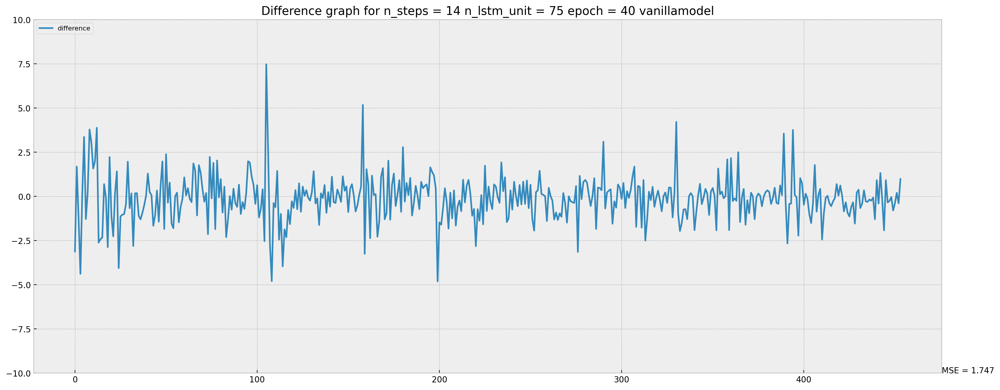

(14, 75, 1)


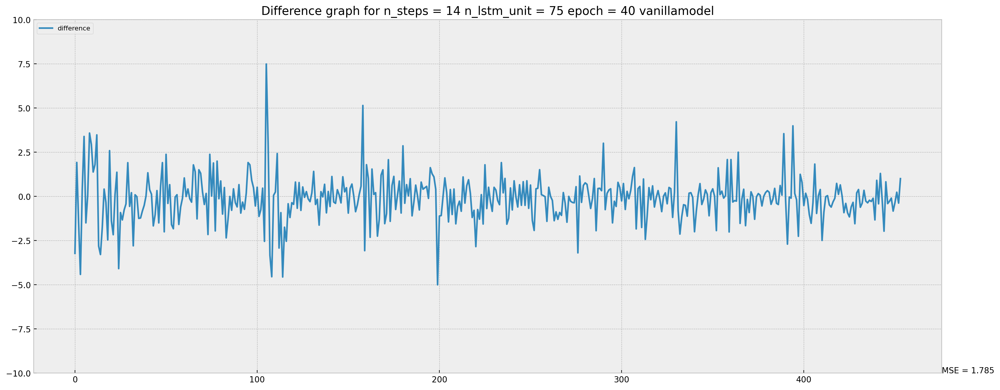

(14, 75, 2)


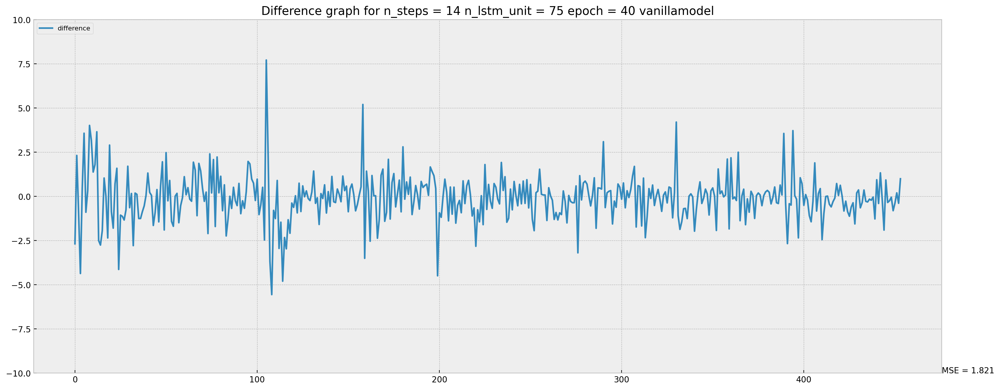

(14, 75, 3)


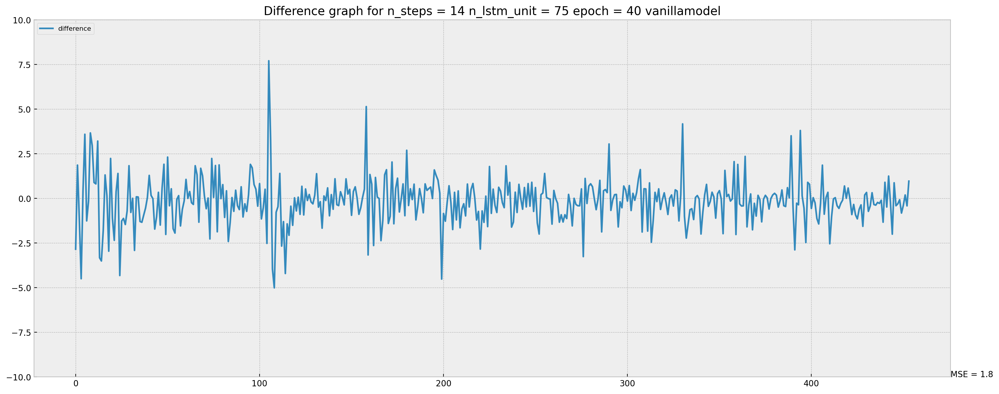

(14, 75, 4)


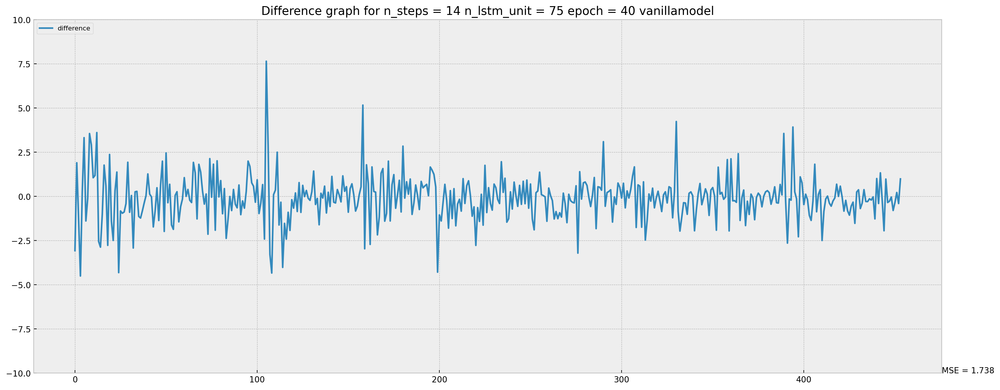

(14, 100, 0)


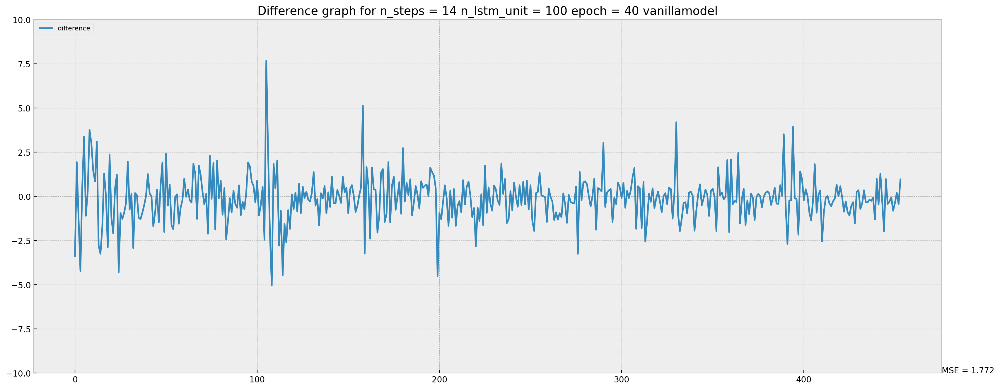

(14, 100, 1)


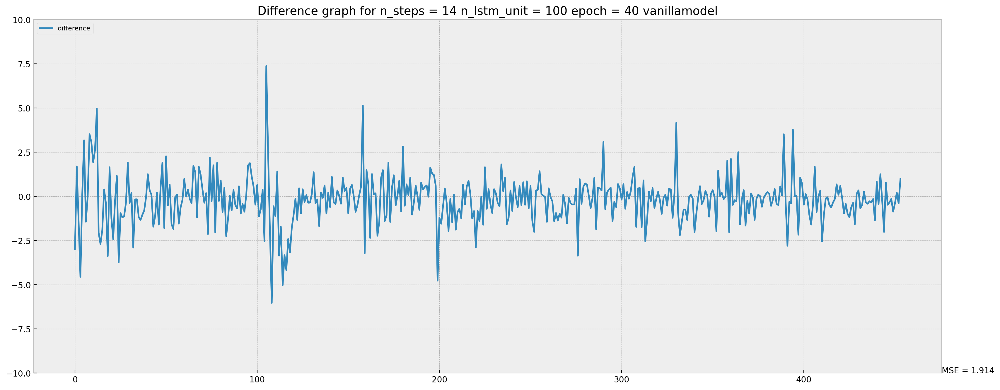

(14, 100, 2)


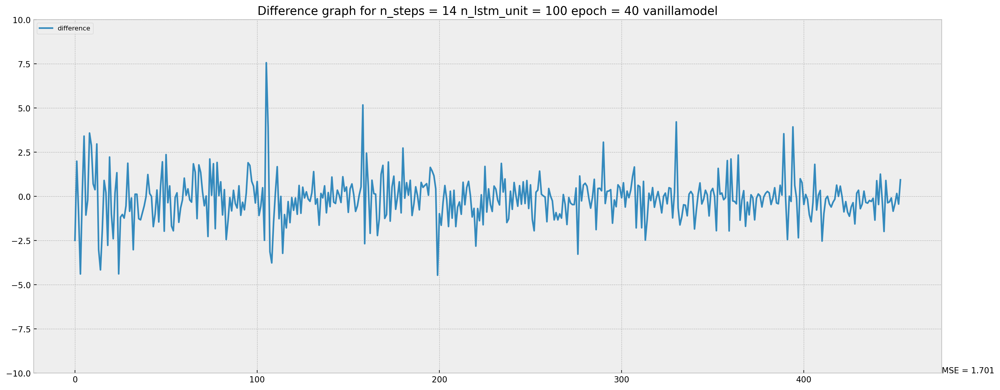

(14, 100, 3)


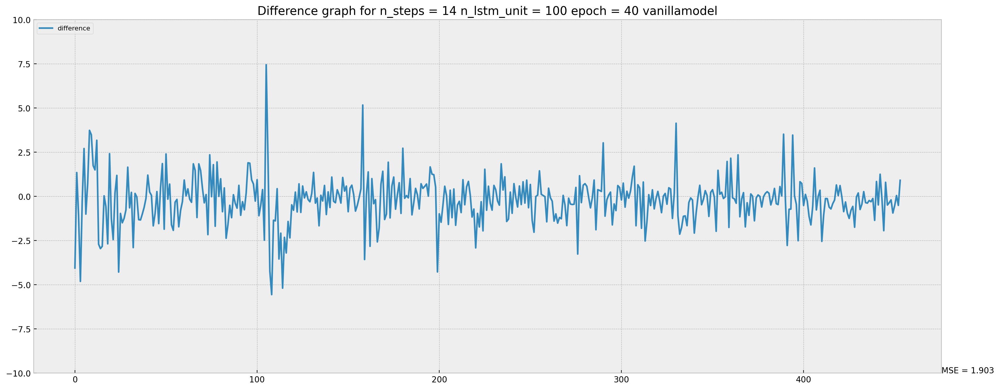

(14, 100, 4)


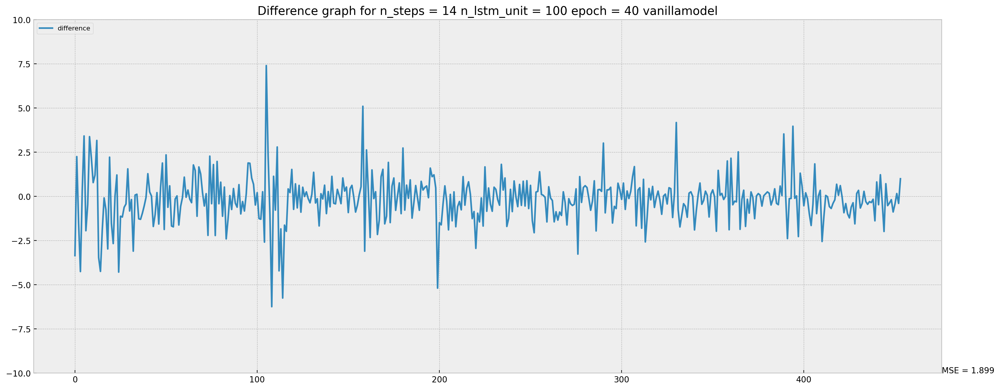

(20, 75, 0)


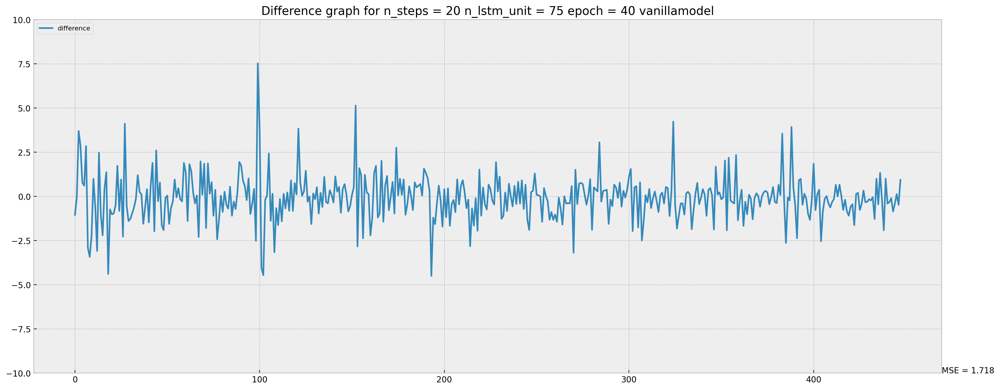

(20, 75, 1)


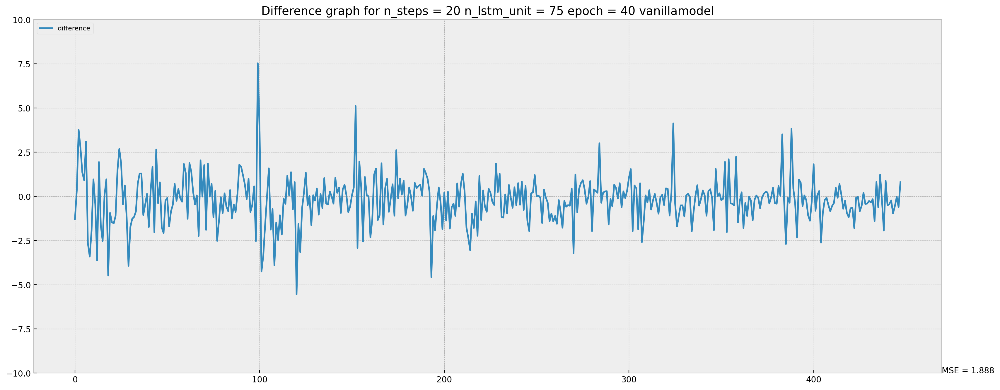

(20, 75, 2)


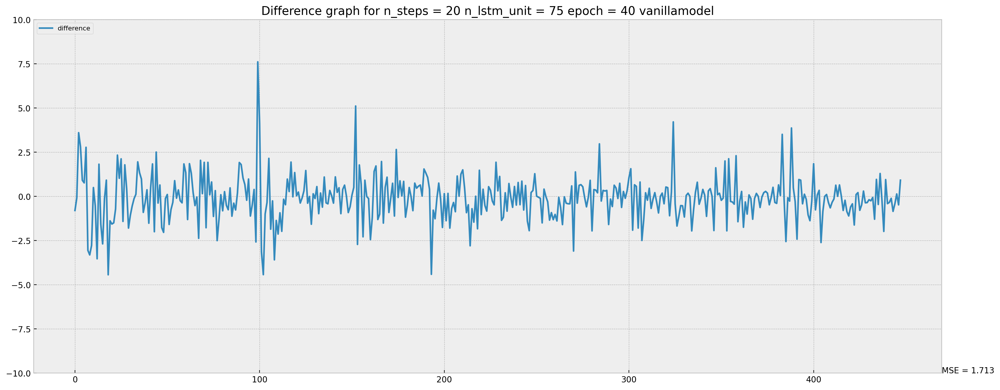

(20, 75, 3)


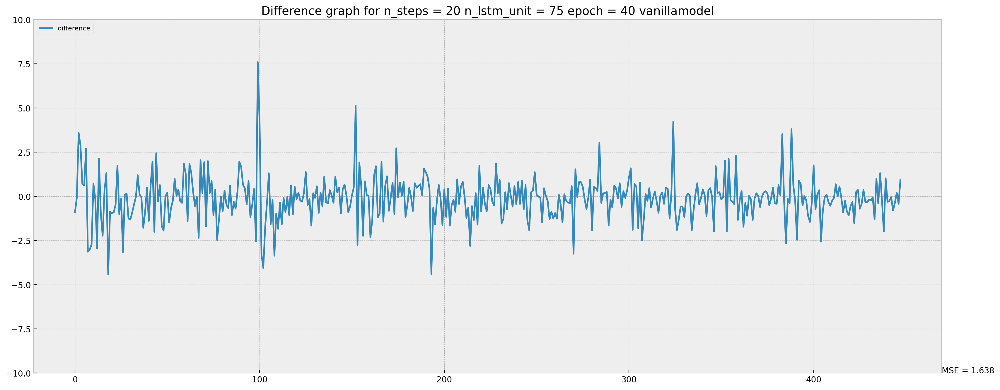

(20, 75, 4)


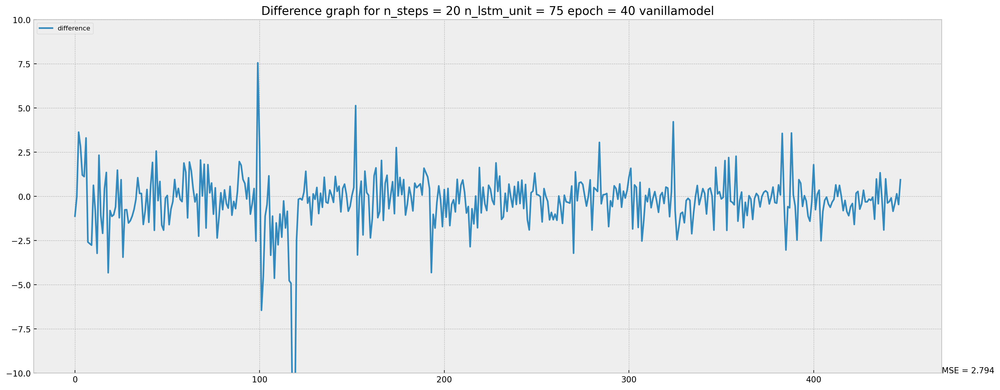

(20, 100, 0)


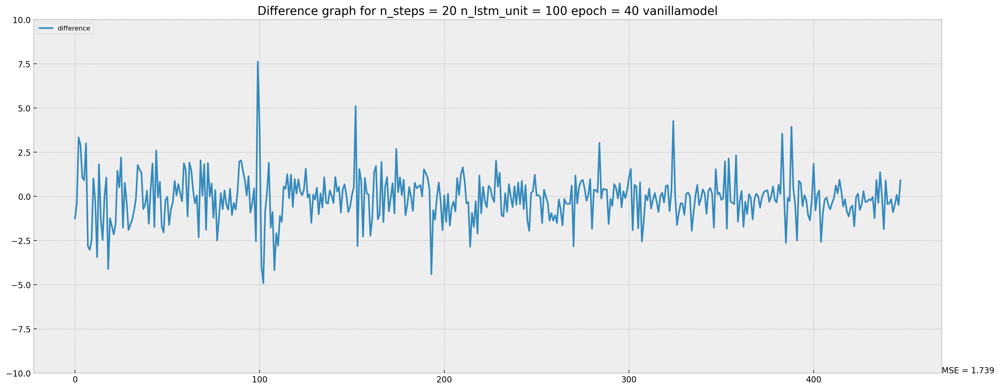

(20, 100, 1)


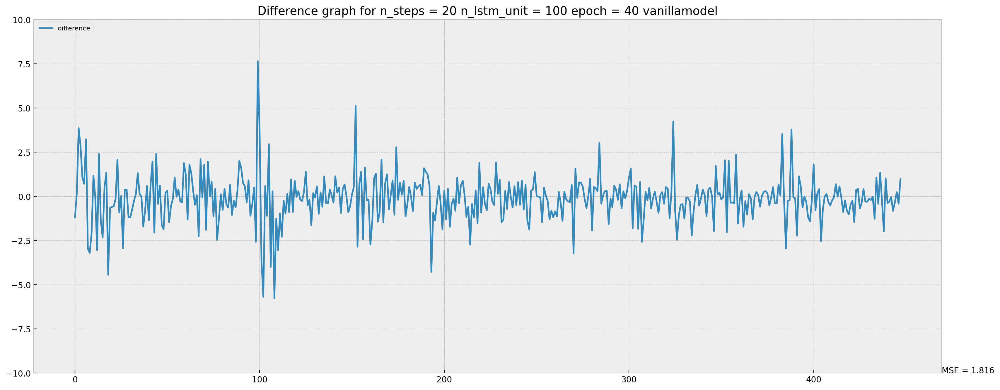

(20, 100, 2)


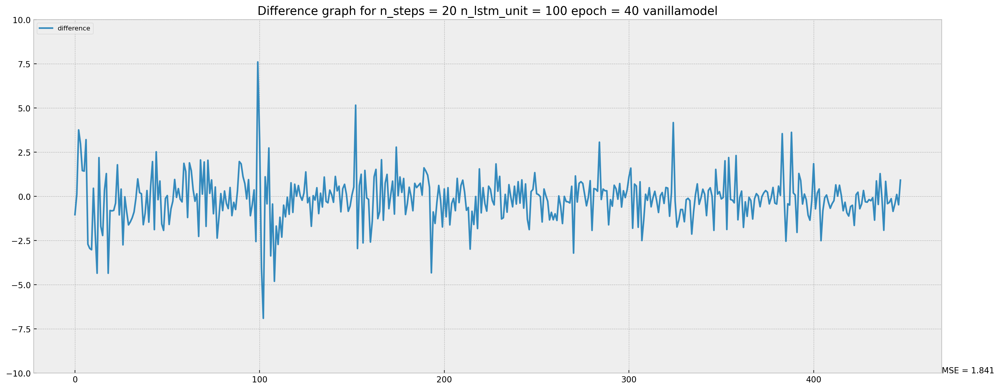

(20, 100, 3)


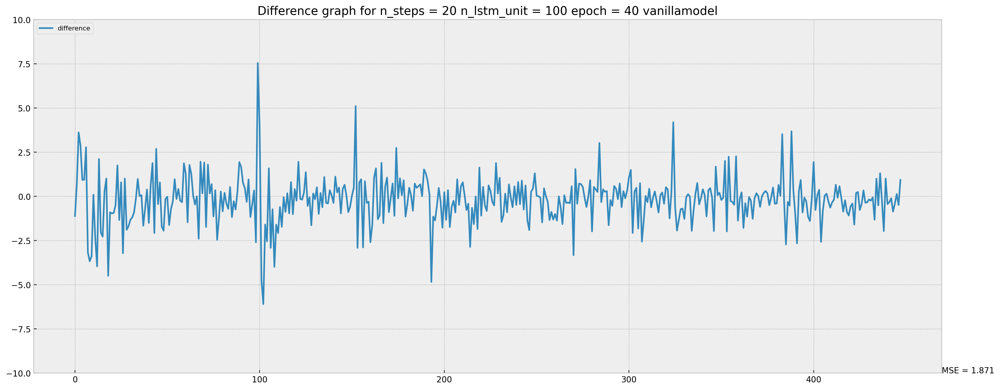

(20, 100, 4)


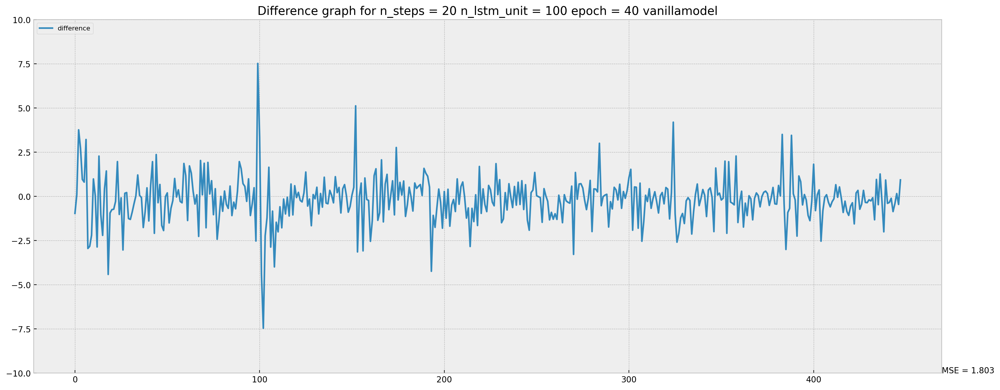

In [ ]:
# Vanilla Method 2b
# https://www.investopedia.com/ask/answers/122414/what-are-most-common-periods-used-creating-moving-average-ma-lines.asp#:~:text=Common%20Moving%20Averages%20Periods&text=For%20identifying%20significant%2C%20long%2Dterm,averages%20are%20the%20most%20common.

# All Values
# N_STEPS = [3, 5, 7, 10, 14, 20]
# N_LSTM_UNIT = [25, 50, 75, 100]

# Some valus to save time
N_STEPS = [14, 20]
N_LSTM_UNIT = [75, 100]


LSTM_TYPE = ["vanilla"]
N_FEATURES = 1


TRAIN = df[(df.Date >= startDay) & (df.Date <= midDay)]
TEST = df[df.Date > midDay]

vanillam2_mse_error_dict= {}

for STEP in N_STEPS:
  for lstm in LSTM_TYPE:
    for LSTMUNIT in N_LSTM_UNIT:
      for i in range(5):
        print((STEP, LSTMUNIT, i))
        diff, mse = run_model(STEP, LSTMUNIT, N_FEATURES, TRAIN, TEST, lstm, plot_forecast=False, epoch=40, plot_diff=True, meth='2')

        if (lstm, STEP, LSTMUNIT) not in vanillam2_mse_error_dict:
          vanillam2_mse_error_dict[(lstm, STEP, LSTMUNIT)] = [mse]
        else:
          vanillam2_mse_error_dict[(lstm, STEP, LSTMUNIT)].append(mse)

        # vanilla_diff_dict[(lstm, STEP, LSTMUNIT)] = diff


In [ ]:
print(vanillam2_mse_error_dict)


{('vanilla', 14, 75): [1.7468428537056258, 1.7845788927265471, 1.8214597955556089, 1.7997873181471438, 1.738428902252292], ('vanilla', 14, 100): [1.7715223950068393, 1.914241252151417, 1.7012647411381294, 1.9029387924100414, 1.8991937294278494], ('vanilla', 20, 75): [1.718150434705129, 1.8884152167344799, 1.7133990638851924, 1.6378005126964947, 2.7936632213290897], ('vanilla', 20, 100): [1.7390598902965118, 1.8158567280503277, 1.8406319940805747, 1.8708863864432312, 1.8029420680331172]}


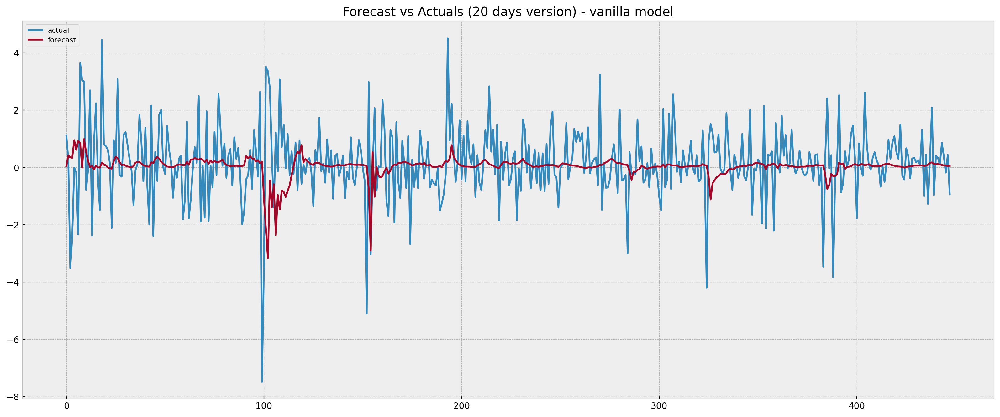

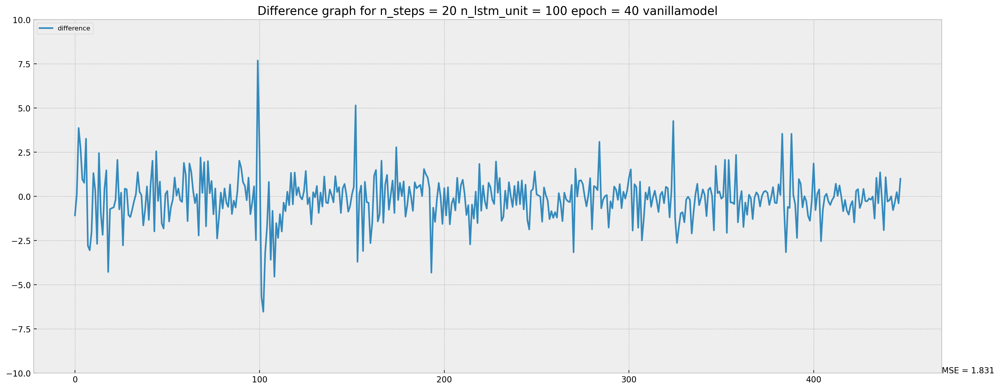

In [ ]:
# THIS IS THE FINAL RUN WITH ALL THE TUNED PARAMETER for method 1 

train_m2 = df[(df.Date >= startDay) & (df.Date <= midDay)]
test_m2 = df[df.Date > midDay]
 
diff, mse = run_model(20, 100, 1, train_m2, test_m2, "vanilla", plot_forecast=True, epoch=40, plot_diff=True, meth='2')

In [ ]:
print(diff)
print()

_, _, _, test_y_run = generate_data_for_lstm2(7, train_m2, test_m2)

pred_p = []

true_p = []
for i in range(len(diff)):
  pred_p.append(sum(diff[:i+1]))

for i in range(len(test_y_run)):
  true_p.append(sum(test_y_run[:i+1]))

print(true_p)
print(pred_p)


[-1.0758910876512573, 0.12554918885231814, 3.869548012018214, 2.7573727500438565, 0.9614863491058259, 0.7722432351112332, 3.2623459362983738, -2.7880198001861345, -3.0470111397654023, -2.008555769920349, 1.3167414951324474, 0.3098361659050113, -2.6846044012904144, 2.447129550725208, -0.9518011111020996, -2.171660242378721, 0.4335586804151603, 1.4739863588660853, -4.274927389621723, -0.717587528228762, -0.6633577325940223, -0.6199779481440544, -0.18642778493466494, 2.0673329538107055, -0.7321824103593713, 0.21148153781888368, -2.7710005998611393, 0.43741538584234263, 0.4019919779896668, -1.0534995213151035, -1.169219683408727, -0.7453456285595905, -0.2712671877443995, 0.11808528624476367, 1.3688394200801781, 0.2569757664203678, 0.07180254638194583, -1.6384454089402993, -0.7375798475742386, 0.5631055065989585, -1.3290546509623766, 0.7073447723686854, 2.0159163863956735, -1.9803331083059277, 2.5533402055501995, -0.25427425742148557, 0.835838974714278, -1.5315757060050998, -1.8136910295486

# Model 4: ElasticNet Model

In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.metrics import mean_squared_error

In [ ]:
def fit_ElasticNet(method, train, test, n):
  train_en = method(train, n)
  test_en = method(test, n)
  train_x_en = getX(train_en).values
  train_y_en = getY(train_en).values
  test_x_en = getX(test_en).values
  test_y_en = getY(test_en).values
  en = ElasticNet(random_state=0, max_iter=5000, l1_ratio= .5)
  en.fit(train_x_en, train_y_en)
  train_preds = en.predict(train_x_en)
  train_score = mean_squared_error(train_y_en, train_preds)
  preds = en.predict(test_x_en)
  score = mean_squared_error(test_y_en, preds)
  return preds, test_y_en, train_score, score 

In [ ]:
def plot_ElasticNet_result(actual, pred, method_name, score, train_score):
  plt.figure(figsize=(12,5), dpi=100)
  plt.plot(actual, label='actual')
  plt.plot(pred, label='forecast')
  plt.title(method_name + ' Forecast vs Actuals, Train Loss: ' + str(train_score) + ', Test Loss: ' + str(score))
  plt.legend(loc='upper left', fontsize=8)
  plt.show()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


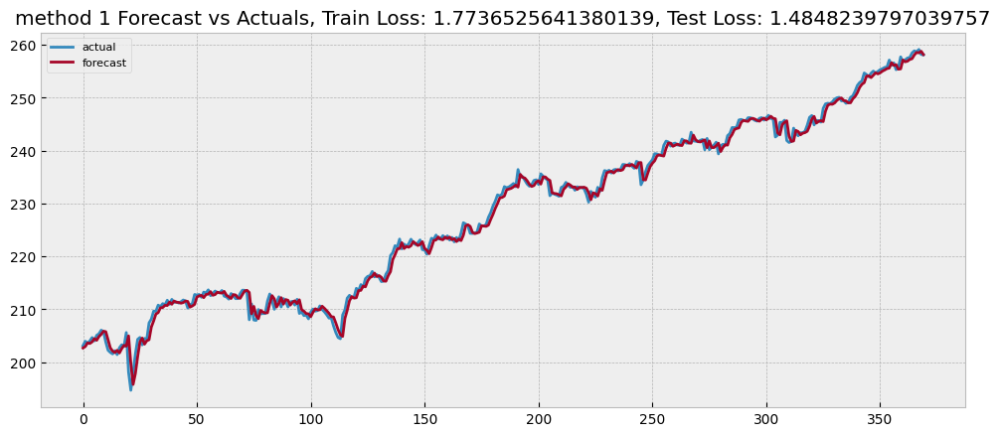

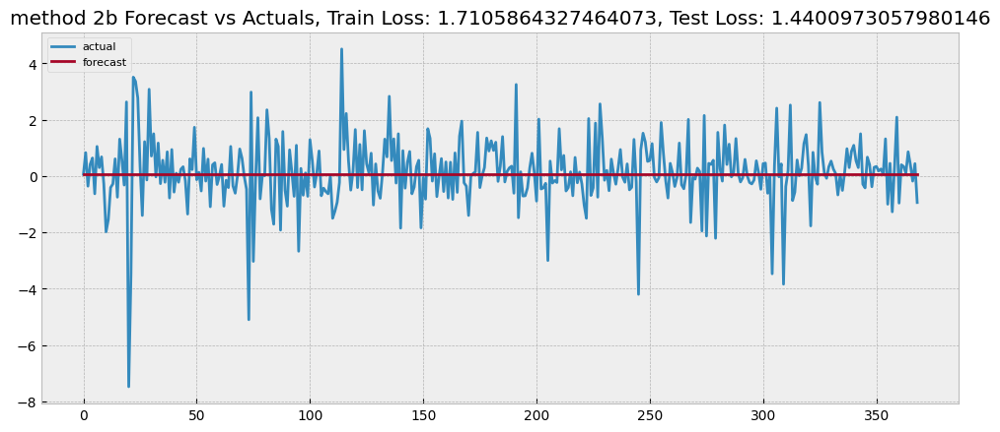

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


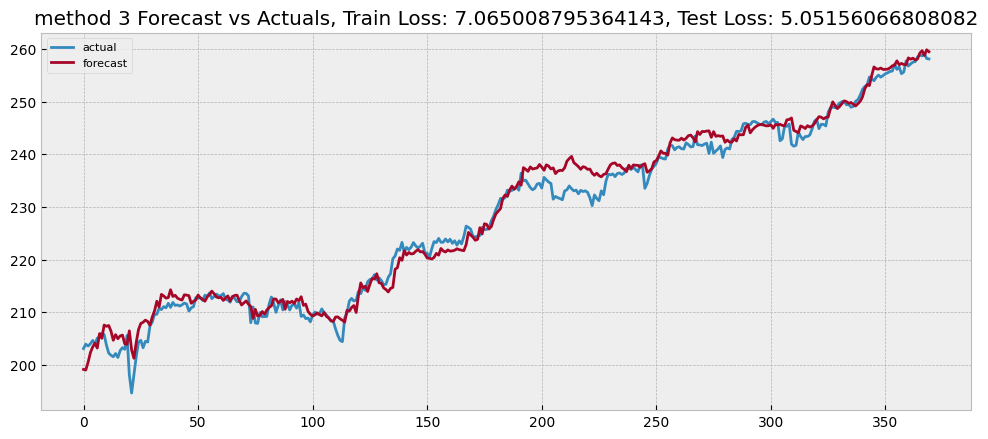

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  app.launch_new_instance()


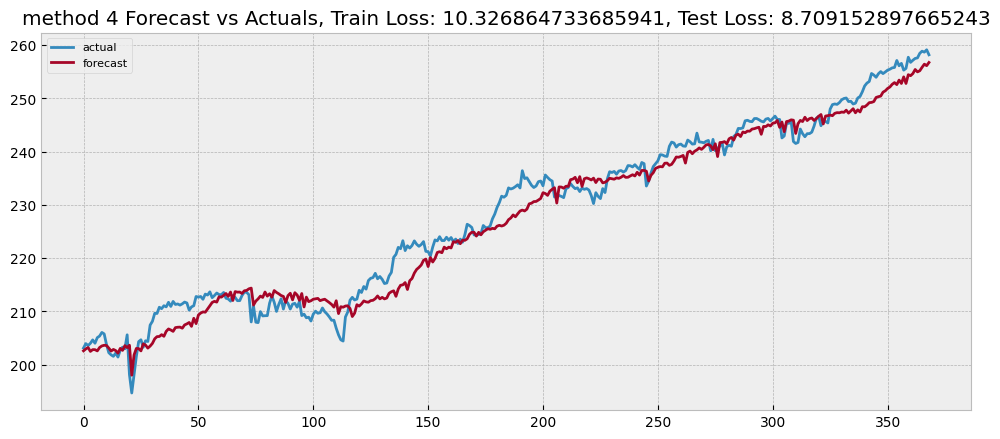

In [ ]:
# # method 1
p_1, t_1, train_score1, score1 = fit_ElasticNet(lambda df, n: method1(df, n), train, test, 100)
plot_ElasticNet_result(t_1, p_1, 'method 1', score1, train_score1)

# method 2B
p_2b, t_2b, train_score2b, score2b = fit_ElasticNet(lambda df, n: method2B(df, n), train, test, 100)
plot_ElasticNet_result(t_2b, p_2b, 'method 2b', score2b, train_score2b)

# method 3
p_3, t_3, train_score3, score3 = fit_ElasticNet(lambda df, n: method3(df, n), train, test, 100)
plot_ElasticNet_result(t_3, p_3, 'method 3', score3, train_score3)

# method 4
p_4, t_4, train_score4, score4 = fit_ElasticNet(lambda df, n: method4(df, n), train, test, 100)
plot_ElasticNet_result(t_4, p_4, 'method 4', score4, train_score4)

# Model Deployment
- what would be the performance like for other ETFs 


  GET all possible dataset - import here  

In [ ]:
def f(df,fname):
  # train test split 
  random.seed(1)
  startDay = '2009-01-01'
  midDay = '2015-12-31'
  train = df[(df.Date >= startDay) & (df.Date <= midDay)]
  test = df[df.Date > midDay]
  


  # linear regression method1 n= 1
  train_1 = method1(train, 1)
  test_1 = method1(test, 1)
  train_x_1_1 = getX(train_1)
  train_y_1_1 = getY(train_1)
  test_x_1_1 = getX(test_1)
  test_y_1_1 = getY(test_1)
  
  model_fit_1_1 = LinearRegression().fit(train_x_1_1, train_y_1_1)
  y_pred_1_1 = model_fit_1_1.predict(test_x_1_1)
  test_error = np.mean((y_pred_1_1 - test_y_1_1) ** 2)
  train_error = np.mean((train_y_1_1 -  model_fit_1_1.predict(train_x_1_1)) ** 2)
  """
  print("Method 1 error - Model being linear regression :")
  print("Train Error: ", train_error)
  print("Test Error: ", test_error)
  """



  
  train_2B = method2B(train, 100)
  test_2B = method2B(test, 100)
  train_x_2B = getX(train_2B)
  train_y_2B = getY(train_2B)
  test_x_2B = getX(test_2B)
  test_y_2B = getY(test_2B)

  # The following ridge, lasso , PCA using same test_x_2B test_y_2B as specified here 

  # ridge method2b n = 100
  ridge2 = TimeSeriesRidgeCV(train_x_2B, train_y_2B,10)
  ridge2B_train_error = mean_squared_error(train_y_2B, ridge2.predict(train_x_2B))
  ridge2error = mean_squared_error(test_y_2B, ridge2.predict(test_x_2B))
  """
  print("Method 2B error:")
  print("ridge regression with 10-fold cross validation training error: ", ridge2B_train_error)
  print("ridge regression with 10-fold cross validation testing error: ", ridge2error)
  """

  # lasso method 2b n = 100.   
  lasso2B = TimeSeriesLassoCV(train_x_2B, train_y_2B,10)
  lasso2B_train_error = mean_squared_error(train_y_2B, lasso2B.predict(train_x_2B))
  lasso2Berror = mean_squared_error(test_y_2B, lasso2B.predict(test_x_2B))
  """
  print("Method 2B error:")
  print("lasso regression with 10-fold cross validation training error: ", lasso2B_train_error)
  print("lasso regression with 10-fold cross validation testing error: ", lasso2Berror)
  """

  #pca method 2b n = 100 m = 1.     

  pca2 = PCA()
  regr = LinearRegression()
  X_reduced_train = pca2.fit_transform(train_x_2B)
  n = len(X_reduced_train)

                      
  X_reduced_test = pca2.transform(test_x_2B)[:,:1]
  PCA_2B = X_reduced_train[:,:1]

  # Train regression model on training data 
  regr = LinearRegression()
  regr.fit(X_reduced_train[:,:1], train_y_2B)

  # Prediction with test data
  pred = regr.predict(X_reduced_test)
  pred_train = regr.predict(X_reduced_train[:,:1])


  # ARIMA
  arima_train_error, arima_test_error = test_auto_arima(train, test)


  # Elastic Net Method 2b
  p_2b, t_2b, train_score2b, score2b = fit_ElasticNet(lambda df, n: method2B(df, n),train,test ,100)

  """
  print("Method 2B PCA error:")
  print("PCA training error: ", mean_squared_error(train_y_2B, pred_train))
  print("PCA testing error: ", mean_squared_error(test_y_2B, pred))
  """

  
  train_lstm2 = df[(df.Date >= startDay) & (df.Date <= midDay)]
  test_lstm2 = df[df.Date > midDay]
  
  diff, lstm_mse = run_model(20, 100, 1, train_lstm2, test_lstm2, "vanilla", plot_forecast=False, epoch=30, plot_diff=False, meth='2')
  



  names_lst = ["df_name","LR_method1 n=1 train error", "LR_method1 n=1 test error","ridge2B_train_error","ridge2error","lasso2B_train_error","lasso2Berror","PCA train error", "PCA test error", "ARIMA train error", "ARIMA test error", "LSTM", "Elastic Net train loss", "Elastic Net test loss"]
  val_lst = [fname,train_error,test_error,ridge2B_train_error,ridge2error,lasso2B_train_error,lasso2Berror,mean_squared_error(train_y_2B, pred_train),mean_squared_error(test_y_2B, pred), arima_train_error, arima_test_error, lstm_mse, train_score2b, score2b]

  return val_lst



hyg.us.txt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, f

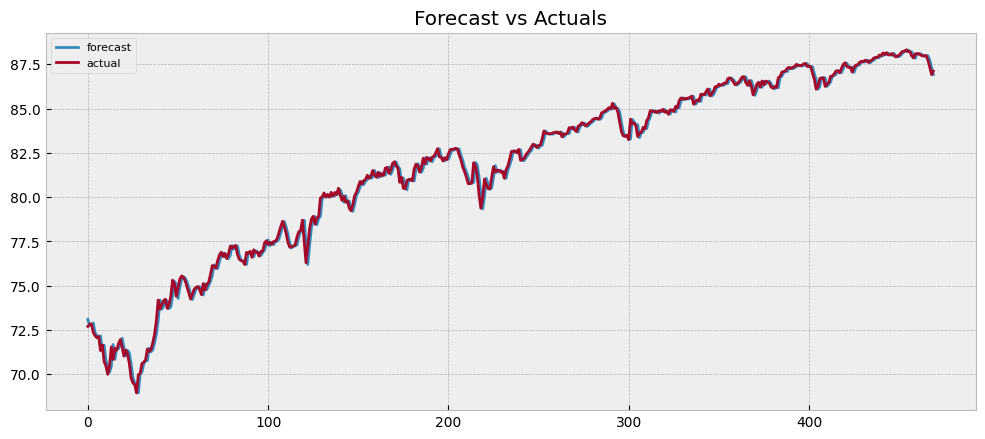

qqq.us.txt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zero

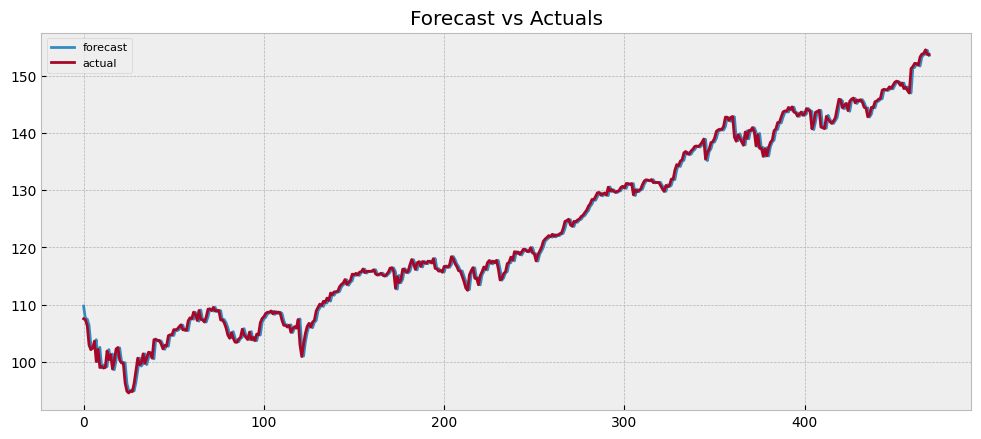

tqqq.us.txt


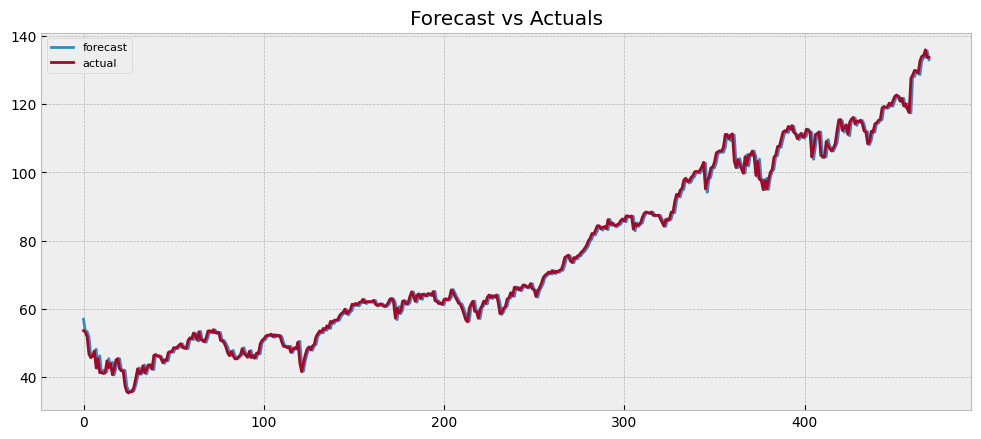

soxl.us.txt


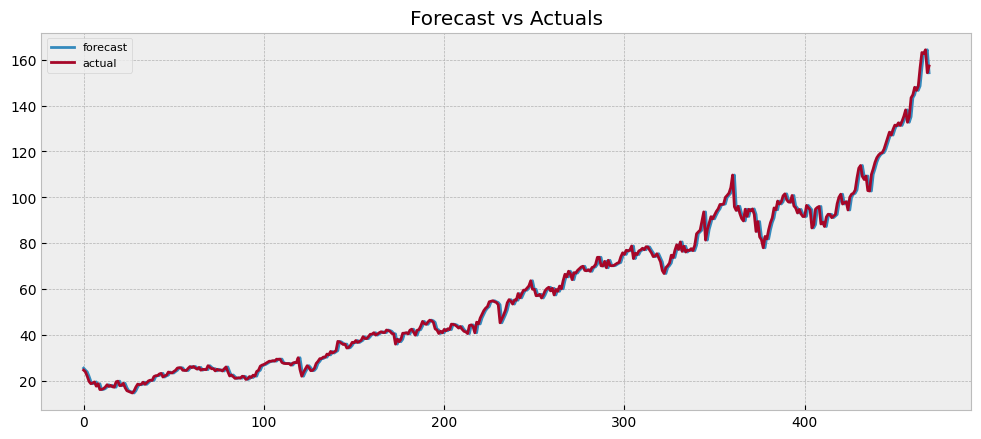

spy.us.txt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zero

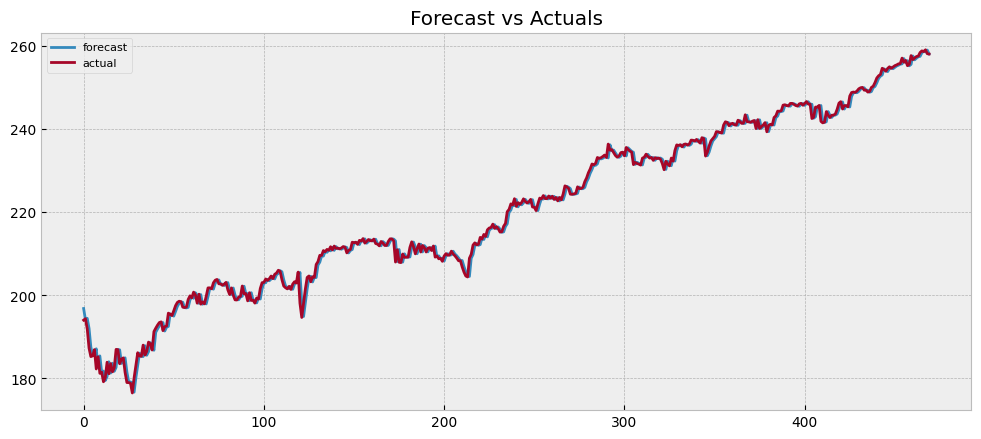

xlf.us.txt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, f

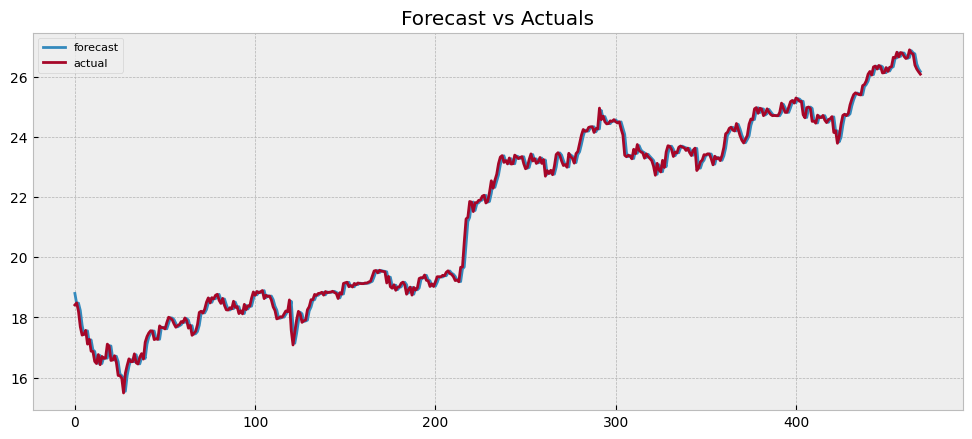

eem.us.txt


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, f

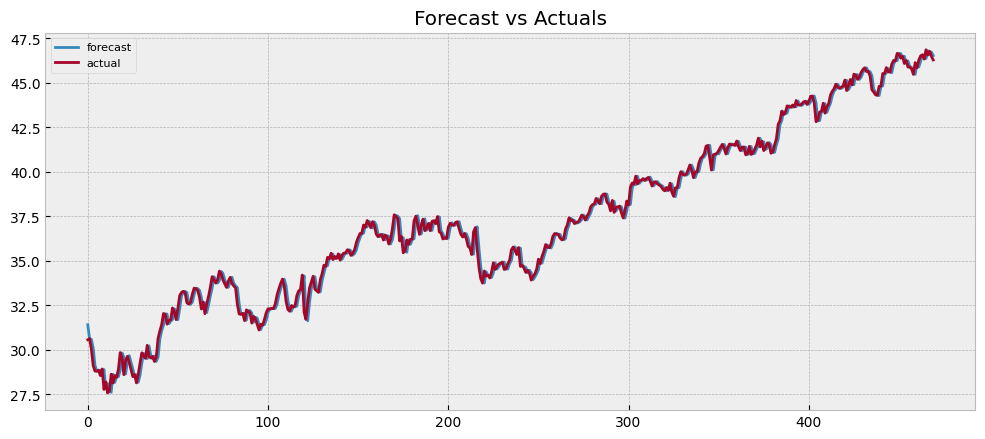

In [ ]:

import pandas as pd
import os


# Other Most Popular ETFs - By Trading Volume
ETFS = ["TQQQ",
"SOXL" ,
"SPY",
"QQQ",
"XLF",
"EEM",
"HYG"]

directory_path = '/content/drive/MyDrive/Data/ETFs'
directory_files = os.listdir(directory_path)

big_lst = []

for file in directory_files:
    for etf in ETFS : 
      fname = file.split(".")[0]
      if etf.lower() == fname :
        print(file)
        df_file = pd.read_csv(os.path.join(directory_path, file), encoding = 'ISO-8859-1',low_memory=False)
        lst = f(df_file,fname)
        big_lst.append(lst)


col_names = [ "df_name","LR_method1 n=1 train error", "LR_method1 n=1 test error","ridge2B_train_error","ridge2error","lasso2B_train_error","lasso2Berror","PCA train error", "PCA test error", "ARIMA train error", "ARIMA test error", "LSTM", "Elastic Net train loss", "Elastic Net test loss"]
otherETFs = pd.DataFrame (big_lst, columns = col_names)



In [ ]:
otherETFs = pd.DataFrame (big_lst, columns = col_names)

In [ ]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)
otherETFs 

,df_name,LR_method1 n=1 train error,LR_method1 n=1 test error,ridge2B_train_error,ridge2error,lasso2B_train_error,lasso2Berror,PCA train error,PCA test error,ARIMA train error,ARIMA test error,LSTM,Elastic Net train loss,Elastic Net test loss
0,hyg,0.15445,0.10493,0.11300,0.08305,0.12401,0.08442,0.12386,0.08451,1.63451,0.10542,0.09619,0.12401,0.08442
1,qqq,0.52711,1.00796,0.48620,0.88095,0.53725,0.84170,0.53651,0.84240,0.98240,1.04247,0.90787,0.53725,0.84170
2,tqqq,0.75010,3.11560,0.65153,3.61832,0.79629,3.18856,0.79200,3.20304,0.75566,3.25806,19.58442,0.79629,3.18856
3,soxl,0.47575,5.52456,0.42836,7.03671,0.48397,6.59287,0.48375,6.60386,0.53723,5.40238,5.80914,0.48397,6.59287
4,spy,1.76491,1.87718,1.58141,1.46474,1.71059,1.44010,1.70992,1.43843,5.48666,1.90303,1.78679,1.71059,1.44010
5,xlf,0.03579,0.04360,0.02711,0.04192,0.02820,0.04156,0.02815,0.04157,0.08283,0.04417,0.04407,0.02820,0.04156
6,eem,0.29302,0.15808,0.26036,0.14581,0.28221,0.14296,0.28194,0.14230,0.59609,0.15938,0.14823,0.28221,0.14296


for soxl : model training error is small and test error is slightly much higher - this indicates that our parameter chosen is appropriate 
but it might not have the ability to give accurate prediction of future price outcome 


In [ ]:
def pricePlot(df): 
  plt.figure(figsize=(30, 15))

  plt.plot(df.Date, df.High, label='High Price', linewidth=1)
  plt.plot(df.Date, df.Low, label='Low Price', linewidth=1)
  plt.plot(df.Date, df.Open, label='Open Price', linewidth=1)
  plt.plot(df.Date, df.Close, label='Close Price', linewidth=1)

  plt.title('Price by Date')
  plt.xlabel('Date')
  plt.ylabel('Price')
  plt.legend()
  plt.show()


In [ ]:
spy = pd.read_csv('/content/drive/MyDrive/Data/ETFs/spy.us.txt') 
hyg = pd.read_csv('/content/drive/MyDrive/Data/ETFs/hyg.us.txt') 
soxl = pd.read_csv('/content/drive/MyDrive/Data/ETFs/soxl.us.txt') 

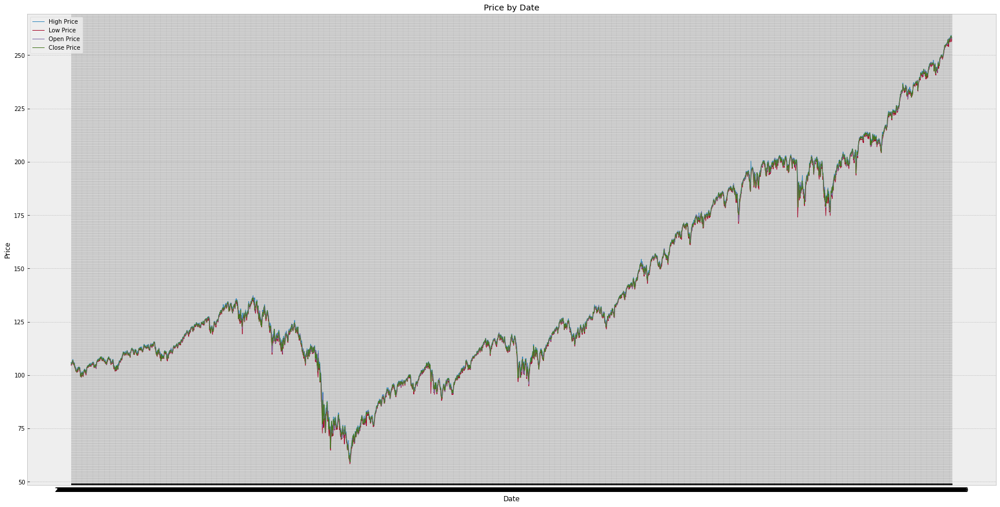

In [ ]:
pricePlot(spy)

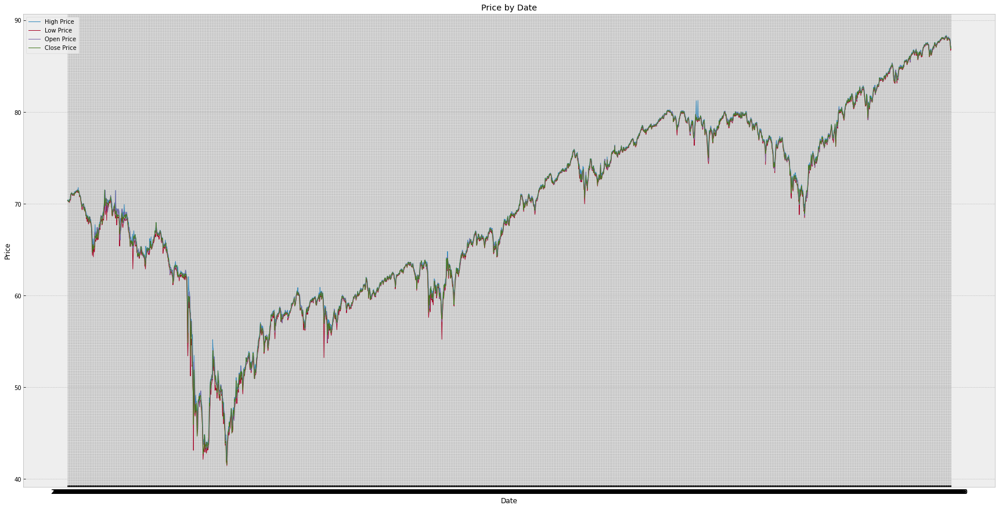

In [ ]:
pricePlot(hyg)

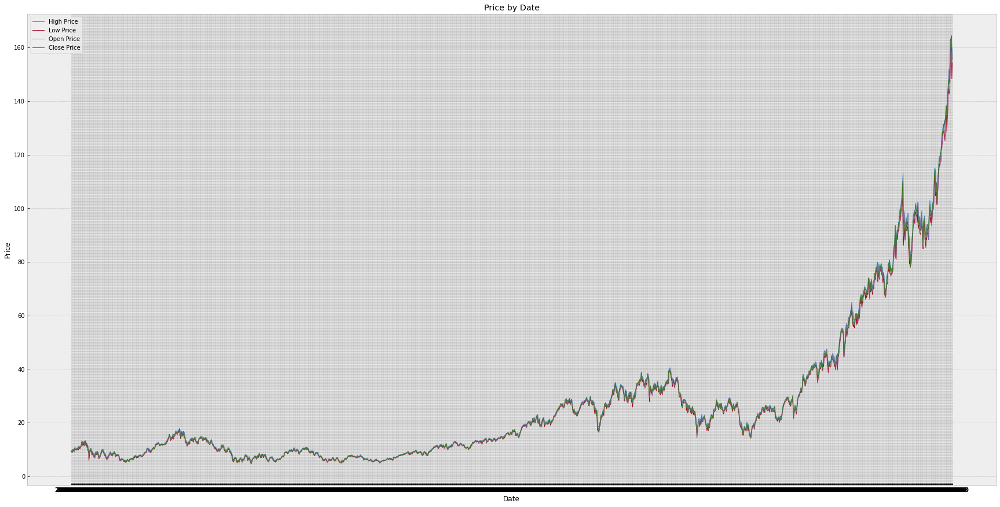

In [ ]:
pricePlot(soxl) # soxl is exponential distribution , while price trend is linear 

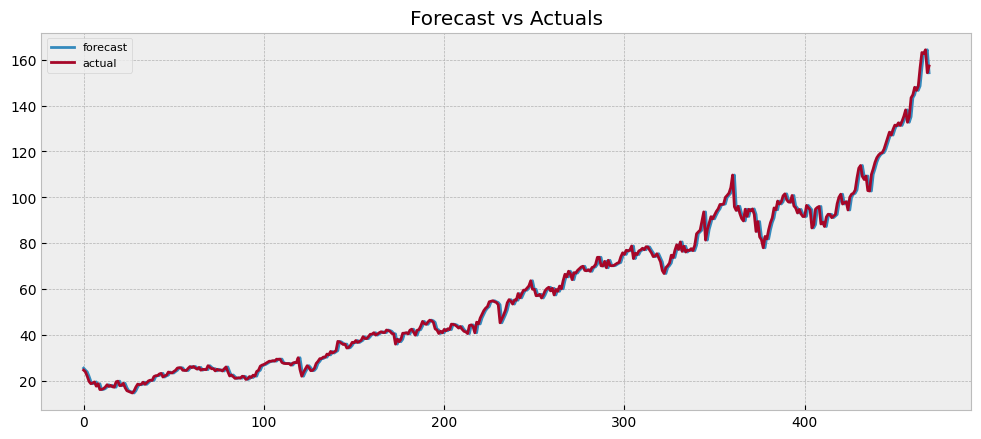

['soxl',
 0.4757539306732557,
 5.524562430168667,
 0.42836188753970167,
 7.036714496145289,
 0.4839670671700348,
 6.592871371303218,
 0.483746747932885,
 6.603861765481518,
 0.5372277568284652,
 5.402382514893619,
 255.57477198403996,
 0.4839670671700348,
 6.592871371303218]

In [ ]:
f(soxl,"soxl")
#soxl	0.47575	5.52456	

# References

**General approach**

J. Shen and M. O. Shafiq, “Short-term stock market price trend prediction using a comprehensive deep learning system,” Journal of Big Data, vol. 7, no. 1, 2020. 

K. (Y. Li, “Predicting stock prices using machine learning,” neptune.ai, 22-Jul-2022. [Online]. Available: https://neptune.ai/blog/predicting-stock-prices-using-machine-learning. [Accessed: 15-Nov-2022]. 

**Feature Extraction Method 4**

M. Vijh, D. Chandola, V. A. Tikkiwal, and A. Kumar, “Stock closing price prediction using Machine Learning Techniques,” Procedia Computer Science, vol. 167, pp. 599–606, 2020. 

**Ridge / Lasso Regression**

D. C. Team, “Lasso and ridge regression tutorial,” DataCamp, 25-Mar-2022. [Online]. Available: https://www.datacamp.com/tutorial/tutorial-lasso-ridge-regression. [Accessed: 15-Nov-2022]. 

**ARIMA Model**

R. J. Hyndman and G. Athanasopoulos, “ARIMA Models,” in Forecasting: Principles and practice, Melbourne: O Texts, 2018. 

What Is Arima Model In Time Series | How Arima Model Works | Time Series Forecasting | Intellipaat. YouTube, 2022. 

“Arima modeling,” CORP-MIDS1 (MDS), 04-Aug-2022. [Online]. Available: https://www.mastersindatascience.org/learning/statistics-data-science/what-is-arima-modeling/. [Accessed: 15-Nov-2022]. 

S. Prabhakaran, “Arima model - complete guide to time series forecasting in python: ML+,” Machine Learning Plus, 03-Sep-2022. [Online]. Available: https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/. [Accessed: 15-Nov-2022]. 

A. Zajic, “Introduction to AIC — Akaike Information Criterion,” Towards Data Science. [Online]. Available: https://towardsdatascience.com/introduction-to-aic-akaike-information-criterion-9c9ba1c96ced. [Accessed: 15-Nov-2022]. 

**LSTM**

P. Srivastava, “Long short term memory: Architecture of LSTM,” Analytics Vidhya, 18-May-2020. [Online]. Available: https://www.analyticsvidhya.com/blog/2017/12/fundamentals-of-deep-learning-introduction-to-lstm/. [Accessed: 15-Nov-2022].  

J. Brownlee, “How to develop LSTM models for time series forecasting,” Machine Learning Mastery, 27-Aug-2020. [Online]. Available: https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/. [Accessed: 15-Nov-2022]. 

B. G. Teo, “Stock prices prediction using long short-term memory (LSTM) model in Python,” Medium, 26-Oct-2021. [Online]. Available: https://medium.com/the-handbook-of-coding-in-finance/stock-prices-prediction-using-long-short-term-memory-lstm-model-in-python-734dd1ed6827. [Accessed: 15-Nov-2022]. 

“Using LSTM in stock prediction and Quantitative Trading.” [Online]. Available: https://cs230.stanford.edu/projects_winter_2020/reports/32066186.pdf. [Accessed: 15-Nov-2022]. 

J. B. Maverick, “Most commonly-used periods in creating moving average (MA) lines,” Most Commonly-Used Periods in Creating Moving Average (MA) Lines, 22-Jun-2022. [Online]. Available: https://www.investopedia.com/ask/answers/122414/what-are-most-common-periods-used-creating-moving-average-ma-lines.asp#:~:text=Common%20Moving%20Averages%20Periods&amp;text=For%20identifying%20significant%2C%20long%2Dterm,averages%20are%20the%20most%20common. [Accessed: 15-Nov-2022]. 

N. Sinha, “Understanding LSTM and its quick implementation in Keras for sentiment ...,” Towards Data Science, 20-Feb-2018. [Online]. Available: https://towardsdatascience.com/understanding-lstm-and-its-quick-implementation-in-keras-for-sentiment-analysis-af410fd85b47. [Accessed: 15-Nov-2022]. 

